gg-napari-env

In [1]:
import napari
from napari_czifile2 import napari_get_reader
from cellpose import models, plot, utils, core, models, train
from cellpose.io import logger_setup
import cellpose.io as cio 
import torch 
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.measure import find_contours
import pandas as pd
import skimage.exposure as exposure
from skimage.morphology import remove_small_objects
import numpy as np
from skimage.measure import label, regionprops
import seaborn as sns
import os 
import sys 
from skimage.transform import resize
from skimage.filters import threshold_otsu, threshold_yen, try_all_threshold
from skimage.exposure import equalize_adapthist
from skimage.measure import label, regionprops
from scipy.ndimage import binary_erosion, gaussian_filter, binary_dilation, binary_fill_holes
from skimage import exposure
import sys 
import xml.etree.ElementTree as ET
from plotting import * 
white_plotting()
import warnings
import matplotlib.font_manager as fm
fm.fontManager.__init__()
warnings.filterwarnings("ignore")
use_GPU = core.use_gpu()
torch.cuda.empty_cache()
print('>>> GPU activated? %d'%use_GPU)
logger_setup()

Initializing plotting package
>>> GPU activated? 1
2025-04-03 16:33:10,624 [INFO] WRITING LOG OUTPUT TO /home/tracking/.cellpose/run.log
2025-04-03 16:33:10,625 [INFO] 
cellpose version: 	3.1.0 
platform:       	linux 
python version: 	3.12.8 
torch version:  	2.5.1+cu124


(<Logger cellpose.io (INFO)>, PosixPath('/home/tracking/.cellpose/run.log'))

In [2]:
def plot_2_channels(results, c1, c2, c1_name, c2_name, c1_color, c2_color, coordinates, image, metadata, all_rois, input, file, 
                    pixel_bounds=100, bbox_expansion=5, 
                    dapi_max=255, c1_max=255, c2_max=255): 
    
    # Remove -T from column names
    results.columns = results.columns.str.split('-T').str[0]

    # Make figure directory
    figure_dir = f'../figures/model_B_only_OSNs/{input}/{file.replace(".czi", "")}-{c1_name}-{c2_name}'
    if not os.path.exists(figure_dir):
        os.makedirs(figure_dir)

    # Clear directory
    for f in os.listdir(figure_dir):
        os.remove(os.path.join(figure_dir, f))

    # Scatter Plot 
    f, ax = plt.subplots(1, 1, figsize=(2, 2), dpi = 400) 
    sns.scatterplot(data=results, x=c1, y=c2, s=10, ax=ax, color='black', alpha=0.3, lw=0)

    # Plot coordinates using the data from the image 
    results_image = results[results['image'] == file].reset_index(drop=True)
    random_colors = sns.color_palette('colorblind', len(coordinates))
    cells = [] 
    for i, coord in enumerate(coordinates): 
        cell_idx = np.argmin(np.linalg.norm(results_image[[c1, c2]].values - coord, axis=1))
        cell = results_image.iloc[cell_idx].copy()  
        sns.scatterplot(data=pd.DataFrame([cell]), x=c1, y=c2, color=random_colors[i], s=30, ax=ax, lw=0, alpha=1)
        cell["color"] = random_colors[i] 
        cell["number"] = i + 1
        cells.append(cell)
    cells = pd.DataFrame(cells)

    # Plotting 
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"Normalized {c1_name} Intensity", fontsize=6) 
    ax.set_ylabel(f"Normalized {c2_name} Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)

    plt.tight_layout()
    plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-scatter.png", format="png", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()

    channels = [(i, metadata['name'][i]) for i in range(len(metadata['name']))]
    channels = [(i, channel) for i, channel in channels if any([name in channel for name in ["DAPI", c1, c2]])]

    # Get scale for scale bar 
    x_scale_5 = 5 / metadata['scale'][2] # 5 um in pixels 

    def set_min_max(channel, min_val, max_val):
        if min_val == max_val:
            return np.zeros_like(channel)  # If min == max, return all zeros
        clipped = np.clip(channel, min_val, max_val)
        rescaled = (clipped - min_val) / (max_val - min_val) * 255
        return np.clip(rescaled, 0, 255)  # Ensure the values remain in the [0, 255] range

    for i, cell in cells.iterrows():
        # Retrieve image and z slice 
        x_bounds = int(cell['centroid_x']) - pixel_bounds, int(cell['centroid_x']) + pixel_bounds 
        y_bounds = int(cell['centroid_y']) - pixel_bounds, int(cell['centroid_y']) + pixel_bounds 
        cell_image = image[0, cell['z'], :, y_bounds[0]:y_bounds[1], x_bounds[0]:x_bounds[1]]  # shape: (channels, H, W)

        # Create composite RGB image
        rgb_image = np.zeros((cell_image.shape[1], cell_image.shape[2], 3), dtype=float)  # (H, W, 3)

        # -- DAPI (Grey): add to all channels
        dapi = [idx for idx, channel in channels if 'DAPI' in channel][0]
        dapi_adjusted = set_min_max(cell_image[dapi], 0, dapi_max)
        rgb_image[..., 0] += dapi_adjusted  # Red
        rgb_image[..., 1] += dapi_adjusted  # Green
        rgb_image[..., 2] += dapi_adjusted  # Blue

        # C1 
        c1_index = [idx for idx, channel in channels if c1 in channel][0]
        c1_adjusted = set_min_max(cell_image[c1_index], 0, c1_max) 
        if c1_color == "magenta": 
            rgb_image[..., 0] += c1_adjusted  
            rgb_image[..., 2] += c1_adjusted  
        elif c1_color == "cyan": 
            rgb_image[..., 1] += c1_adjusted
            rgb_image[..., 2] += c1_adjusted
        elif c1_color == "yellow": 
            rgb_image[..., 0] += c1_adjusted
            rgb_image[..., 1] += c1_adjusted

        # -- Cyan (c2): add to green and blue
        c2_index = [idx for idx, channel in channels if c2 in channel][0]
        c2_adjusted = set_min_max(cell_image[c2_index], 0, c2_max)
        if c2_color == "magenta": 
            rgb_image[..., 0] += c2_adjusted  
            rgb_image[..., 2] += c2_adjusted  
        elif c2_color == "cyan": 
            rgb_image[..., 1] += c2_adjusted
            rgb_image[..., 2] += c2_adjusted
        elif c2_color == "yellow": 
            rgb_image[..., 0] += c2_adjusted
            rgb_image[..., 1] += c2_adjusted

        # Normalize composite image to [0,1]
        rgb_image = np.clip(rgb_image/255, 0, 1)

        # Load ROIs and compute bbox (adjusted relative to the cell image)
        regions = regionprops(all_rois[cell['z'], :, :])
        region_labels = [region.label for region in regions]
        region = regions[region_labels.index(cell['z_id'])]
        bbox = region.bbox
        # Expand bbox by bbox_expansion pixels     
        bbox = (bbox[0] - bbox_expansion, bbox[1] - bbox_expansion, 
                bbox[2] + bbox_expansion, bbox[3] + bbox_expansion)
        # Adjust bbox to cell_image coordinates
        bbox = (bbox[0] - y_bounds[0], bbox[1] - x_bounds[0],
                bbox[2] - y_bounds[0], bbox[3] - x_bounds[0])
        # For clarity, unpack bbox (top, left, bottom, right)
        y1, x1, y2, x2 = bbox

        # Create figure with gridspec: main image in left column (spanning all rows) 
        # and three zoom panels in the right column (each taking 1/3 height)
        # Adjust fig size and width ratios as needed.
        fig_width = 1   # total width (main image + zoom panels)
        fig_height = 0.75  # height of the main image (zoom panels share this height)
        f = plt.figure(figsize=(fig_width, fig_height), dpi=400)
        gs = gridspec.GridSpec(nrows=3, ncols=2, width_ratios=[4, 1])
        ax_main = f.add_subplot(gs[:, 0])
        ax_zoom_gray = f.add_subplot(gs[0, 1])
        ax_zoom_magenta = f.add_subplot(gs[1, 1])
        ax_zoom_cyan = f.add_subplot(gs[2, 1])

        # Plot main composite image
        ax_main.imshow(rgb_image)
        ax_main.axis("off")
        # Add border to main image
        ax_main.add_patch(plt.Rectangle((0, 0), cell_image.shape[2]-1, cell_image.shape[1]-1, fill=False, edgecolor=cell['color'], lw=2))
        # Add text legends on main image
        ax_main.text(5, 25, "DAPI", color='white', fontsize=6, weight='bold')
        ax_main.text(5, 45, c1_name, color=c1_color, fontsize=6, weight='bold')
        ax_main.text(5, 65, c2_name, color=c2_color, fontsize=6, weight='bold')
        # Add scale bar on main image
        ax_main.plot([2*pixel_bounds-20-x_scale_5, 2*pixel_bounds-20], 
                    [2*pixel_bounds-20, 2*pixel_bounds-20], color='white', lw=1)
        
        ax_main.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='white', lw=1))

        # ----- Create zoom panels -----
        # Zoom for Grey (DAPI)
        zoom_dapi = dapi_adjusted[y1:y2, x1:x2]
        # Build RGB image: all channels get the DAPI intensity
        dapi_zoom = np.zeros((zoom_dapi.shape[0], zoom_dapi.shape[1], 3), dtype=float)
        dapi_zoom[..., 0] = zoom_dapi
        dapi_zoom[..., 1] = zoom_dapi
        dapi_zoom[..., 2] = zoom_dapi
        dapi_zoom = np.clip(dapi_zoom/255, 0, 1)
        ax_zoom_gray.imshow(dapi_zoom)
        ax_zoom_gray.axis("off")
        ax_zoom_gray.add_patch(plt.Rectangle((0, 0), zoom_dapi.shape[1]-1, zoom_dapi.shape[0]-1, fill=False, edgecolor='grey', lw=1))

        # Zoom for Magenta (c1)
        zoom_c1 = c1_adjusted[y1:y2, x1:x2]
        # Build an RGB image: red and blue channels from c1
        zoom_c1_rgb = np.zeros((zoom_c1.shape[0], zoom_c1.shape[1], 3), dtype=float)
        if c1_color == "magenta": 
            zoom_c1_rgb[..., 0] += zoom_c1  
            zoom_c1_rgb[..., 2] += zoom_c1  
        elif c1_color == "cyan": 
            zoom_c1_rgb[..., 1] += zoom_c1
            zoom_c1_rgb[..., 2] += zoom_c1
        elif c1_color == "yellow": 
            zoom_c1_rgb[..., 0] += zoom_c1
            zoom_c1_rgb[..., 1] += zoom_c1
        zoom_c1_rgb = np.clip(zoom_c1_rgb/255, 0, 1)
        ax_zoom_magenta.imshow(zoom_c1_rgb)
        ax_zoom_magenta.axis("off")
        ax_zoom_magenta.add_patch(plt.Rectangle((0, 0), zoom_c1.shape[1]-1, zoom_c1.shape[0]-1, fill=False, edgecolor=c1_color, lw=1))

        # Zoom for Cyan (c2)
        zoom_c2 = c2_adjusted[y1:y2, x1:x2]
        # Build an RGB image: green and blue channels from c2
        zoom_c2_rgb = np.zeros((zoom_c2.shape[0], zoom_c2.shape[1], 3), dtype=float)
        if c2_color == "magenta": 
            zoom_c2_rgb[..., 0] += zoom_c2  
            zoom_c2_rgb[..., 2] += zoom_c2  
        elif c2_color == "cyan": 
            zoom_c2_rgb[..., 1] += zoom_c2
            zoom_c2_rgb[..., 2] += zoom_c2
        elif c2_color == "yellow": 
            zoom_c2_rgb[..., 0] += zoom_c2
            zoom_c2_rgb[..., 1] += zoom_c2
        zoom_c2_rgb = np.clip(zoom_c2_rgb/255, 0, 1)
        ax_zoom_cyan.imshow(zoom_c2_rgb)
        ax_zoom_cyan.axis("off")
        ax_zoom_cyan.add_patch(plt.Rectangle((0, 0), zoom_c2.shape[1]-1, zoom_c2.shape[0]-1, fill=False, edgecolor=c2_color, lw=1))

        plt.tight_layout(pad=0)
        plt.savefig(f"{figure_dir}/{file.replace('.czi', '')}-{c1_name}-{c2_name}-cell_{cell["number"]}.png",
                    format="png", pad_inches=0, bbox_inches='tight', transparent=False)
        plt.show()

In [3]:
def parse_marker_file_z_major(xml_file_path, num_channels):
    """
    Parses an ImageJ Cell Counter XML marker file where Z indices are flattened
    assuming Z-major ordering (Z slices vary fastest, channels slowest), and
    the flattened indices (MarkerZ) are 1-based.

    MarkerZ was calculated in ImageJ as:
        MarkerZ = (z - 1) * num_channels + (channel - 1) + 1
                = 1-based linear index assuming Z-major ordering.

    This function reverses that logic to recover the true Z slice and channel
    as 0-based indices:

        z = (MarkerZ - 1) // num_channels
        channel = (MarkerZ - 1) % num_channels

    Parameters:
    -----------
    xml_file_path : str
        Path to the XML file exported from the ImageJ Cell Counter plugin.

    num_channels : int
        The number of image channels (e.g., 4 if using DAPI, 488, 546, 647).

    Returns:
    --------
    pandas.DataFrame
        A DataFrame with the following columns:
            - 'name'    : The marker type name from the XML (e.g., "488C")
            - 'x'       : Marker X coordinate
            - 'y'       : Marker Y coordinate
            - 'z'       : Recovered Z slice index (0-based)
            - 'channel' : Recovered channel index (0-based)
            - 'image'   : Inferred image filename from XML name
            - 'cytoplasmic' : Derived label from marker name (e.g., "AF488")

    Notes:
    ------
    This has been validated with a test placing markers on:
        - z=1, c=1 → MarkerZ = 1
        - z=1, c=2 → MarkerZ = 2
        - z=1, c=3 → MarkerZ = 3
        - z=2, c=1 → MarkerZ = 4
        - z=2, c=2 → MarkerZ = 5
        - z=2, c=3 → MarkerZ = 6

    The function correctly recovers:
        - z = 0-based z index (e.g., MarkerZ = 4 → z=1)
        - channel = 0-based channel index (e.g., MarkerZ = 4 → channel=0)
    """
    import xml.etree.ElementTree as ET
    import pandas as pd

    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    data = []
    for marker_type in root.findall(".//Marker_Type"):
        name = marker_type.findtext("Name")
        for marker in marker_type.findall("Marker"):
            x = int(marker.findtext("MarkerX"))
            y = int(marker.findtext("MarkerY"))
            z_raw = int(marker.findtext("MarkerZ"))

            # Adjust for 1-based MarkerZ
            z_index = z_raw - 1
            z = z_index // num_channels        # 0-based Z slice
            channel = z_index % num_channels   # 0-based channel index

            data.append({
                'name': name,
                'x': x,
                'y': y,
                'z': z,
                'channel': channel
            })

    df = pd.DataFrame(data)
    df['image'] = xml_file_path.split('CellCounter_')[1].replace('.xml', '.czi')
    df['cytoplasmic'] = df['name'].apply(lambda x: "AF" + x.split("C")[0])
    return df


In [ ]:
def load_cytoplasmic_cell_counts(input, channels, channel_names, normalization=0.001): 
    results_dir = f'../results/{input}'
    results_files = os.listdir(results_dir)
    results_files = [f for f in results_files if f.endswith('.csv')]

    # Load all results 
    results = pd.DataFrame() 
    for f in results_files:
        results_path = os.path.join(results_dir, f)
        results_individual = pd.read_csv(results_path)
        results_individual.columns = results_individual.columns.str.split('-T').str[0]
        results = pd.concat([results, results_individual], axis=0) 
    results = results.reset_index(drop=True)

    # Normalize intensities for each sample using robust quantile-based normalization 
    # This approach "clips" extreme values without discarding them entirely
    for sample in results['image'].unique():
        results_sample = results[results['image'] == sample]
        for channel in channels: 
            #lower = results_sample[channel].quantile(normalization)
            #upper = results_sample[channel].quantile(1-normalization)
            #results_sample[channel] = (results_sample[channel] - lower) / (upper - lower)
            results_sample[channel] = (results_sample[channel] - results_sample[channel].min()) / (results_sample[channel].max() - results_sample[channel].min())
        results.loc[results['image'] == sample] = results_sample

    cell_counts_dir = f'../cytoplasmic-markers/{input}'
    cell_counts_files = os.listdir(cell_counts_dir)
    cellcounts = [] 
    for f in cell_counts_files:
        xml_path = os.path.join(cell_counts_dir, f)
        df = parse_marker_file_z_major(xml_path, num_channels=(len(channels)+1))
        cellcounts.append(df)
    cellcounts = pd.concat(cellcounts, axis=0)
    
    results['cytoplasmic'] = None

    # Iterate through each image
    for image in cellcounts['image'].unique(): 
        # Load ROIs 
        all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
        all_rois = np.load(all_rois_path)
        
        # Get subset of cellcounts for this image
        cellcounts_image = cellcounts[cellcounts['image'] == image]

        # Iterate through each cell 
        for i, cell in cellcounts_image.iterrows():
            rois_z = all_rois[cell['z'], :, :]

            # Get the region label at the cell's coordinates
            region_label = rois_z[cell['y'], cell['x']]  # Note: numpy uses row (y), col (x)

            if region_label > 0: 
                # Get the results row for this cell 
                results_row = results.loc[(results['image'] == cell['image']) & 
                                        (results['z'] == cell['z']) & 
                                        (results['z_id'] == region_label)]
                if len(results_row) == 1: 
                    results.loc[results_row.index[0], 'cytoplasmic'] = cell['cytoplasmic']

    # Get only cytoplasmic cells 
    results_cytoplasmic = results[results['cytoplasmic'].notnull()]

    # Melt the results, grouping by image and channel 
    results_cytoplasmic_melted = results_cytoplasmic.melt(id_vars=['image', 'cytoplasmic'],
                         value_vars=channels,
                         var_name='channel',
                         value_name='intensity').groupby(['image', 'cytoplasmic', 'channel']).mean().reset_index()

    
    # Add the number of cells to the dataframe
    results_cytoplasmic_melted['num_cells'] = results_cytoplasmic_melted.apply(
                                            lambda x: results[(results['image'] == x['image']) & 
                                                            (results['cytoplasmic'] == x['cytoplasmic'])].shape[0], axis=1)

    # Add channel names to the dataframe
    results_cytoplasmic_melted['channel_name'] = results_cytoplasmic_melted['channel'].map(dict(zip(channels, channel_names)))
    results_cytoplasmic_melted['cytoplasmic_name'] = results_cytoplasmic_melted['cytoplasmic'].map(dict(zip(channels, channel_names)))
    # Add " Cytoplasmic" to the cytoplasmic name
    results_cytoplasmic_melted['cytoplasmic_name'] = results_cytoplasmic_melted['cytoplasmic_name'] + " cytoplasmic"

    # Get cell counts 
    cytoplasmic_results_counts = results_cytoplasmic_melted.groupby(['image', 'cytoplasmic_name'])['num_cells'].max().reset_index()

    return results, results_cytoplasmic_melted, cytoplasmic_results_counts

## U34-B3-546 & Chymotrypsin-B2-647 & DAPI
- Chymotrypsin = LOC105276652

In [10]:
input = '20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI'
channels = ['AF546', 'AF647']
channel_names = ['U34', 'LOC105276652']
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.001)
cytoplasmic_results.head()

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250307 B1 Sample 1 Stack.czi,AF546,AF546,1.412056,11,U34,U34 cytoplasmic
1,20250307 B1 Sample 1 Stack.czi,AF546,AF647,0.362092,11,LOC105276652,U34 cytoplasmic
2,20250307 B1 Sample 1 Stack.czi,AF647,AF546,0.033273,8,U34,LOC105276652 cytoplasmic
3,20250307 B1 Sample 1 Stack.czi,AF647,AF647,1.070374,8,LOC105276652,LOC105276652 cytoplasmic
4,20250307 B1 Sample 2 Stack.czi,AF546,AF546,1.266996,12,U34,U34 cytoplasmic


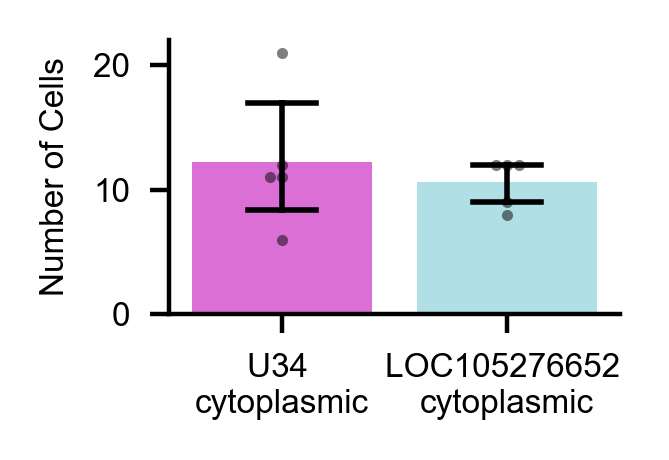

In [11]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', saturation=1, ax=ax, order = ["U34 cytoplasmic", "LOC105276652 cytoplasmic"],
            palette=['orchid', 'powderblue'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.set_xlabel("") 
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

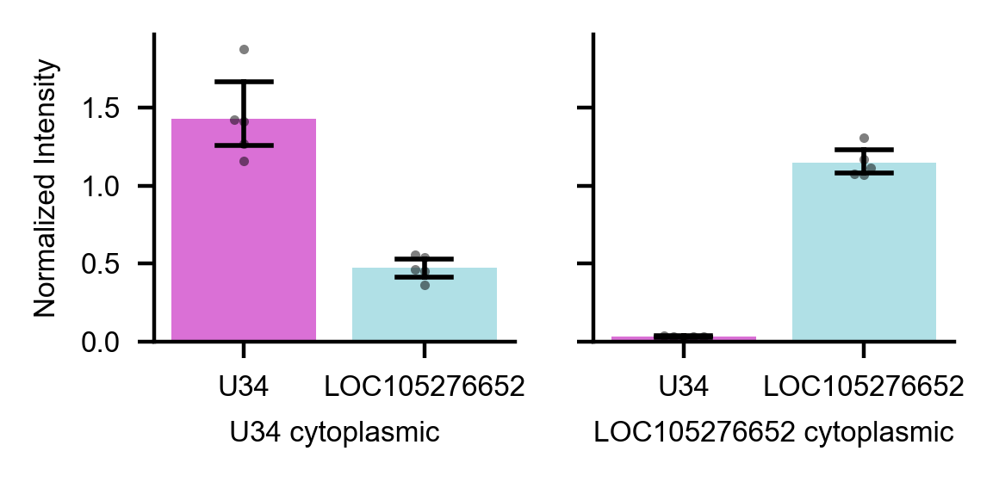

In [12]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
cytoplasmic_channels = ["U34 cytoplasmic", "LOC105276652 cytoplasmic"]
f, axs = plt.subplots(1, 2, figsize=(3, 1.5), dpi = 400, sharey=True)
for i, cytoplasmic_channel in enumerate(cytoplasmic_channels):
    cytoplasmic_results_channel = cytoplasmic_results[cytoplasmic_results["cytoplasmic_name"] == cytoplasmic_channel]
    ax = axs[i]
    sns.barplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, saturation=1, palette=['orchid', 'powderblue'], order=["U34", "LOC105276652"],
                alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
    sns.swarmplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"{cytoplasmic_channel}", fontsize=6)
    ax.set_ylabel("Normalized Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

In [13]:
# sample 4 is the best
file_number = 1
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI/20250307 B1 Sample 4 Stack.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 0.5, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 202, 3, 2048, 2048)
Loaded ../results/20250307 B1 P14 U34-B3-546 Chymotrypsin-B2-647 DAPI/20250307 B1 Sample 4 Stack_rois.npy


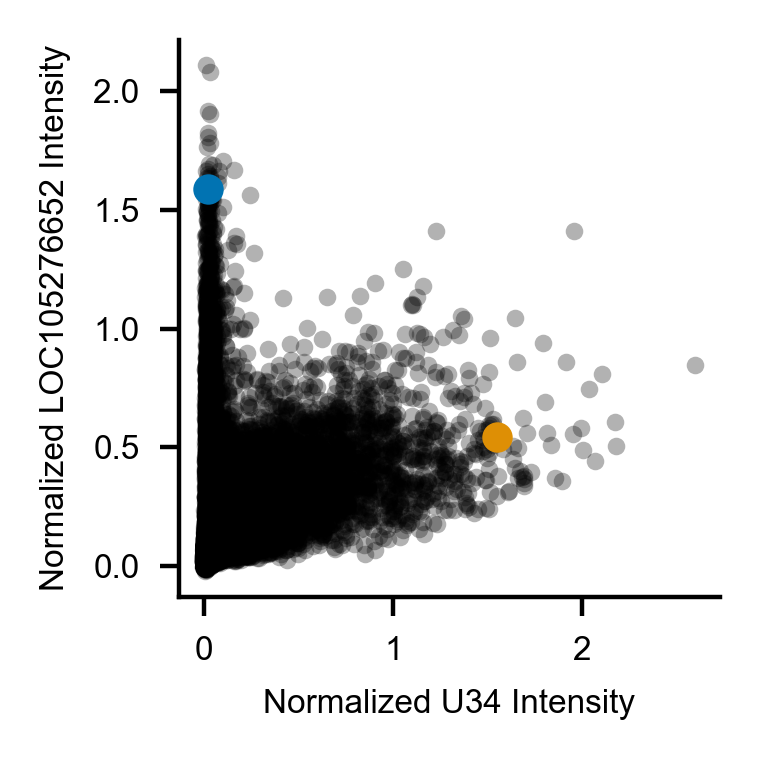

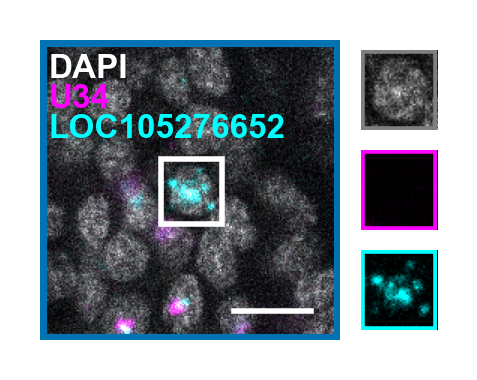

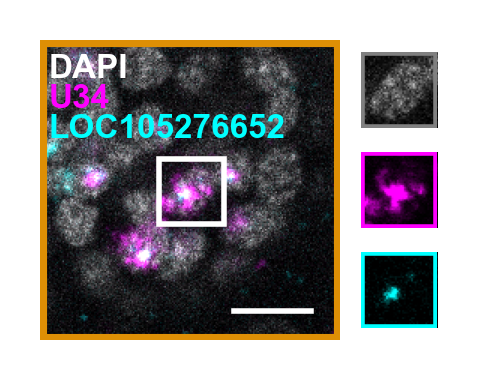

In [14]:
# U34-B3-546 Chymotrypsin-B2-647 DAPI
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF647", 
                c1_name="U34", c2_name="LOC105276652",
                c1_color="magenta", c2_color="cyan", 
                coordinates=[[0, 1.6], [5.5, 1.5]],  
                dapi_max=150, c1_max=150, c2_max=150)

## R2-b3-488 Q1-b1-546 Lnc6-b2-647

In [112]:
input = '20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI'
channels = ['AF488', 'AF546', 'AF647']
channel_names = ['R2-3', 'Q1', 'PR']
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.00001)
cytoplasmic_results.head()

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250328 2 Q1lnc sample 1.czi,AF488,AF488,0.644847,25,R2-3,R2-3 cytoplasmic
1,20250328 2 Q1lnc sample 1.czi,AF488,AF546,0.040331,25,Q1,R2-3 cytoplasmic
2,20250328 2 Q1lnc sample 1.czi,AF488,AF647,0.344764,25,PR,R2-3 cytoplasmic
3,20250328 2 Q1lnc sample 1.czi,AF546,AF488,0.301530,34,R2-3,Q1 cytoplasmic
4,20250328 2 Q1lnc sample 1.czi,AF546,AF546,0.566378,34,Q1,Q1 cytoplasmic


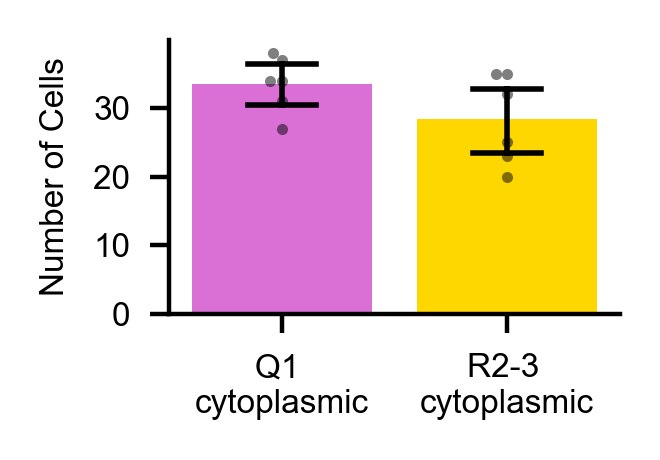

In [113]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, saturation=1, 
            palette=['orchid', 'gold'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.set_xlabel("") 
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

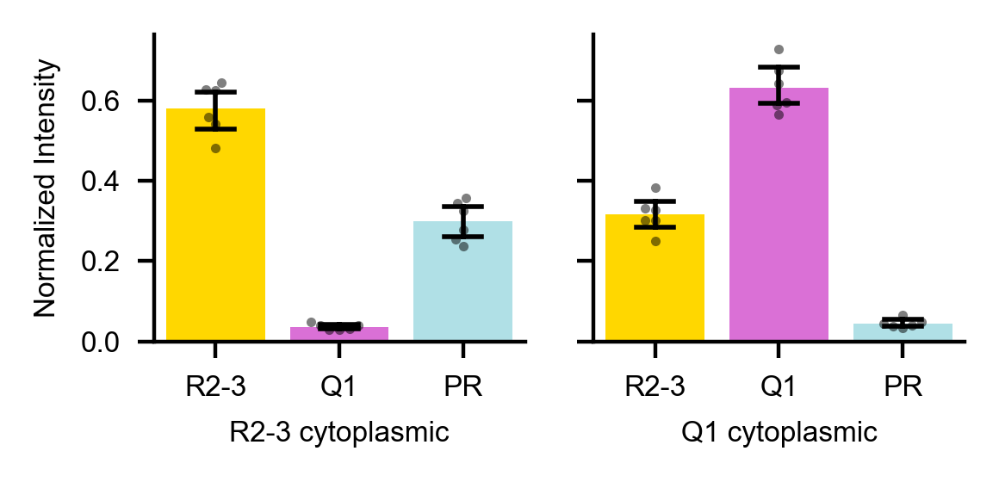

In [114]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
cytoplasmic_channels = cytoplasmic_results["cytoplasmic_name"].unique() 
f, axs = plt.subplots(1, 2, figsize=(3, 1.5), dpi = 400, sharey=True)
for i, cytoplasmic_channel in enumerate(cytoplasmic_channels):
    cytoplasmic_results_channel = cytoplasmic_results[cytoplasmic_results["cytoplasmic_name"] == cytoplasmic_channel]
    ax = axs[i]
    sns.barplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, palette=['gold', 'orchid', 'powderblue'], order=["R2-3", "Q1", "PR"], saturation=1, 
                alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
    sns.swarmplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"{cytoplasmic_channel}", fontsize=6)
    ax.set_ylabel("Normalized Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

In [115]:
file_number = 1
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI/20250328 2 Q1lnc sample 1.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 29976.70913696289, 32989.00331115723), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 85, 4, 2048, 2048)
Loaded ../results/20250328 2 P14 R2-b3-488 Q1-b1-546 Lnc6-b2-647 DAPI/20250328 2 Q1lnc sample 1_rois.npy


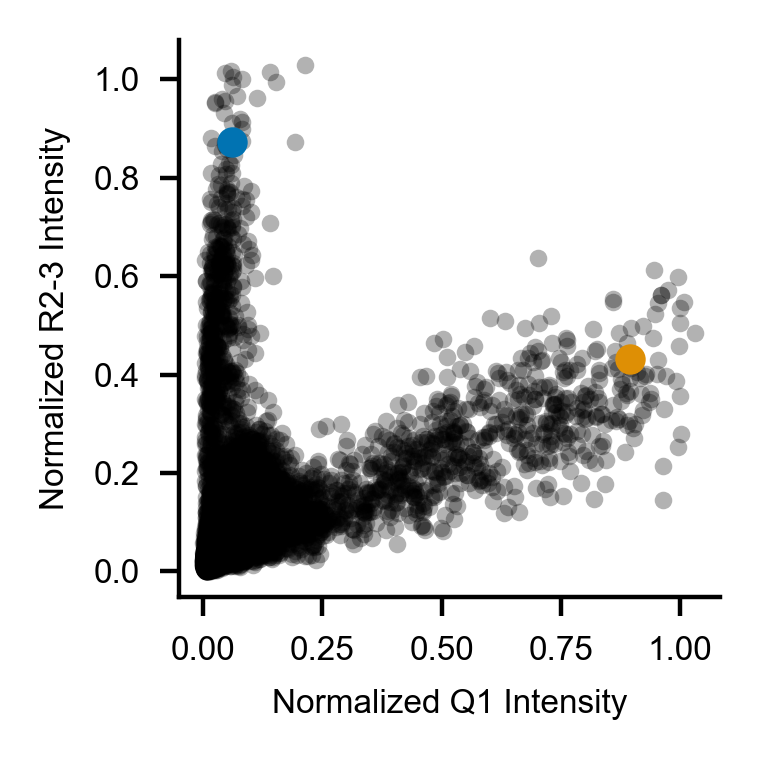

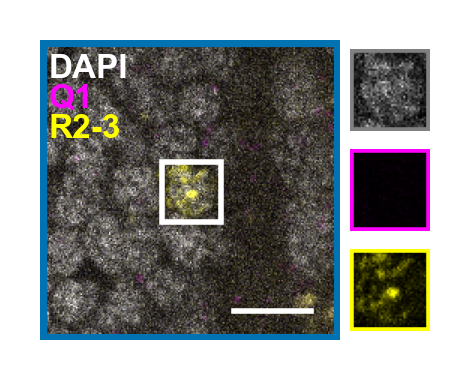

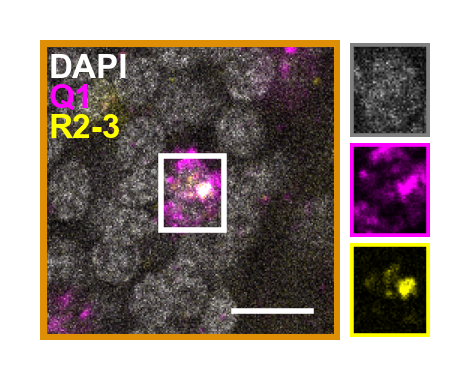

In [116]:
# R2-b3-488 Q1-b1-546 Lnc6-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF488", 
                c1_name="Q1", c2_name="R2-3", 
                c1_color="magenta", c2_color="yellow",
                coordinates=[[0, 0.9], [0.9, 0.4]],  
                dapi_max=100, c1_max=150, c2_max=150)

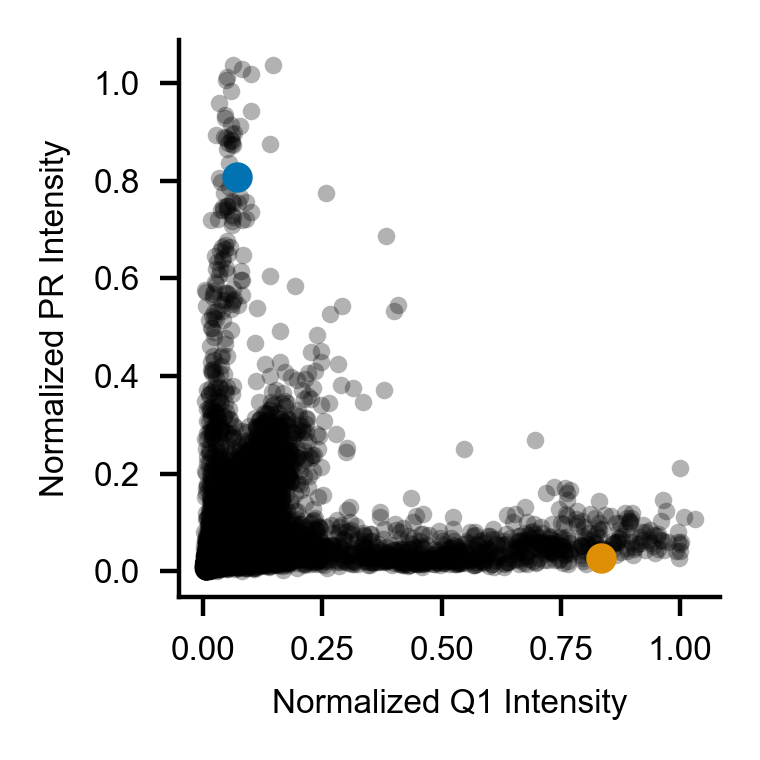

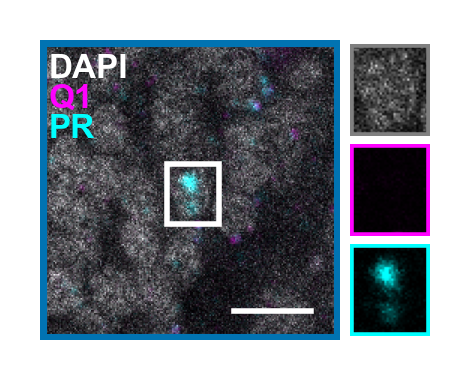

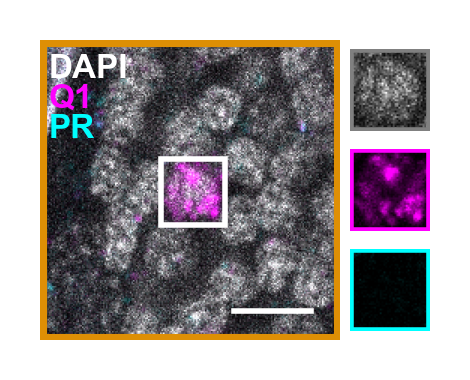

In [117]:
# R2-b3-488 Q1-b1-546 Lnc6-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF647", 
                c1_name="Q1", c2_name="PR", 
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0, 0.8], [0.8, 0]],  
                dapi_max=100, c1_max=150, c2_max=150)

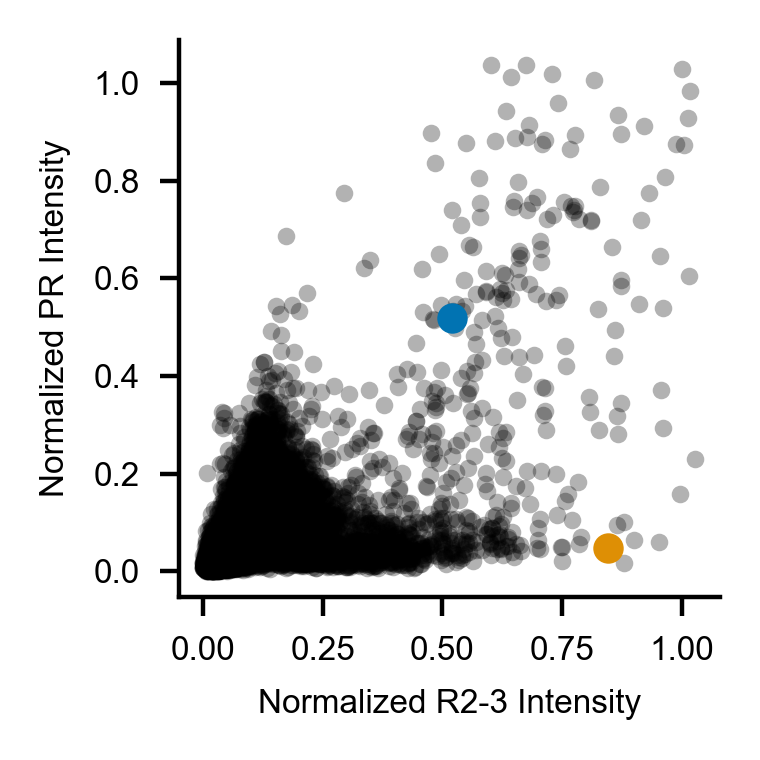

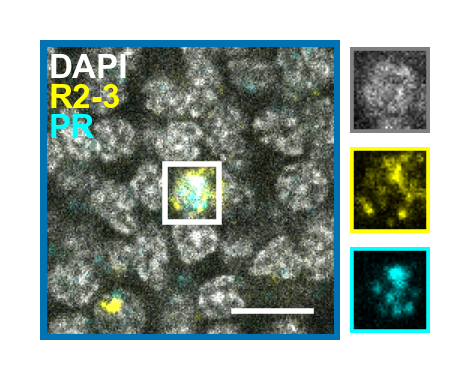

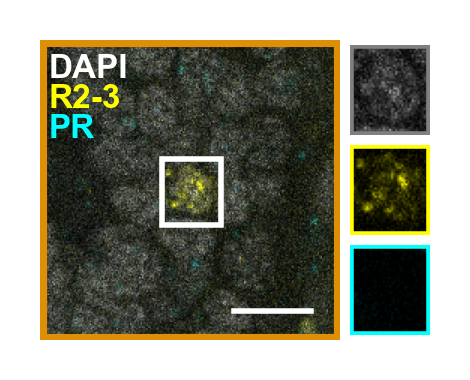

In [121]:
# R2-b3-488 Q1-b1-546 Lnc6-b2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF488", c2="AF647", 
                c1_name="R2-3", c2_name="PR", 
                c1_color="yellow", c2_color="cyan",
                coordinates=[[0.6, 0.6], [0.85, 0]],  
                dapi_max=150, c1_max=150, c2_max=150)

## U34-B3-488 & Lnc4-B1-546 & U21-B5-647 & DAPI 

In [62]:
input = '20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi'
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["U34", "PR", "U21"]
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.00001)
cytoplasmic_results.head()

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250325 4 t19 lncrna sample 1 great.czi,AF488,AF488,0.734915,13,U34,U34 cytoplasmic
1,20250325 4 t19 lncrna sample 1 great.czi,AF488,AF546,0.563987,13,PR,U34 cytoplasmic
2,20250325 4 t19 lncrna sample 1 great.czi,AF488,AF647,0.031846,13,U21,U34 cytoplasmic
3,20250325 4 t19 lncrna sample 1 great.czi,AF647,AF488,0.205354,27,U34,U21 cytoplasmic
4,20250325 4 t19 lncrna sample 1 great.czi,AF647,AF546,0.054654,27,PR,U21 cytoplasmic


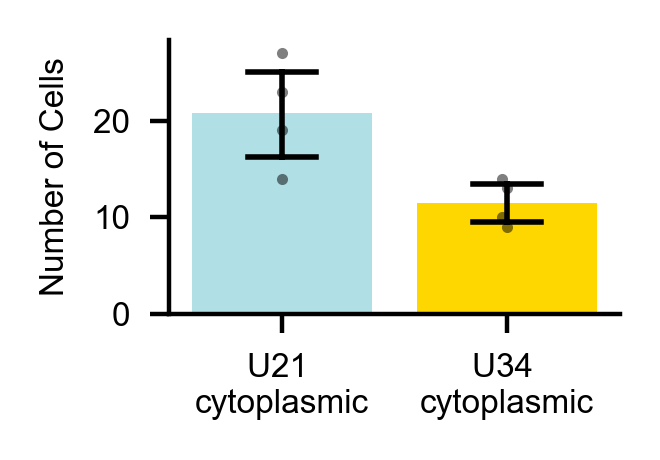

In [63]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(1.75, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, saturation=1, 
            palette=['powderblue', 'gold'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.set_xlabel("") 
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

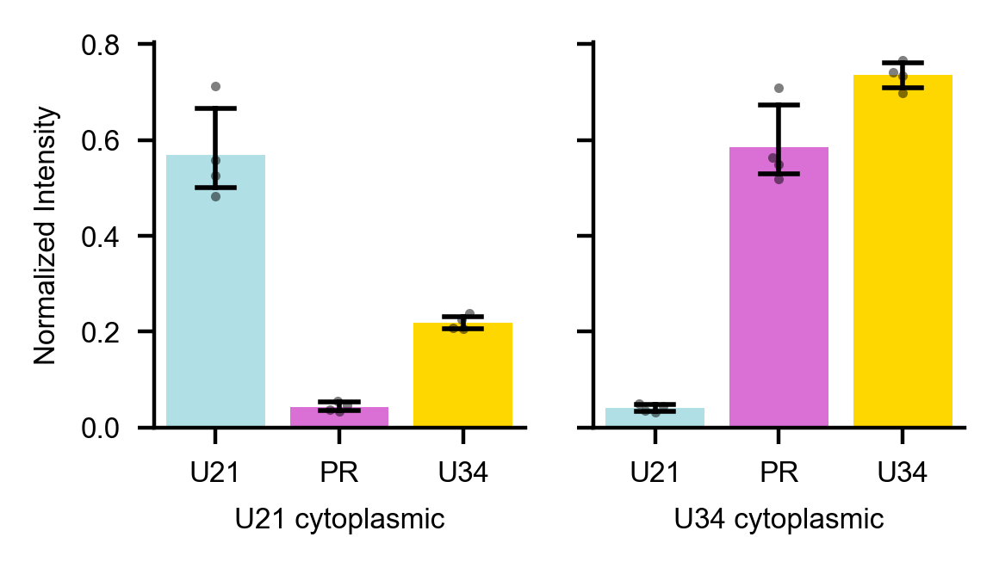

In [64]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
cytoplasmic_channels = ["U21 cytoplasmic", "U34 cytoplasmic"]
f, axs = plt.subplots(1, 2, figsize=(3, 1.75), dpi = 400, sharey=True)
for i, cytoplasmic_channel in enumerate(cytoplasmic_channels):
    cytoplasmic_results_channel = cytoplasmic_results[cytoplasmic_results["cytoplasmic_name"] == cytoplasmic_channel]
    ax = axs[i]
    sns.barplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, palette=['powderblue', 'orchid', 'gold'], order=["U21", "PR", "U34"], saturation=1, 
                alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
    sns.swarmplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"{cytoplasmic_channel}", fontsize=6)
    ax.set_ylabel("Normalized Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

In [65]:
file_number = 0
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi/20250325 4 t19 lncrna sample 4 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 30779.721115112305, 26878.52767944336), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 80, 4, 2048, 2048)
Loaded ../results/20250325 4 p14 u34-b3-488 lnc4-b1-546 u21-b5-647 dapi/20250325 4 t19 lncrna sample 4 great_rois.npy


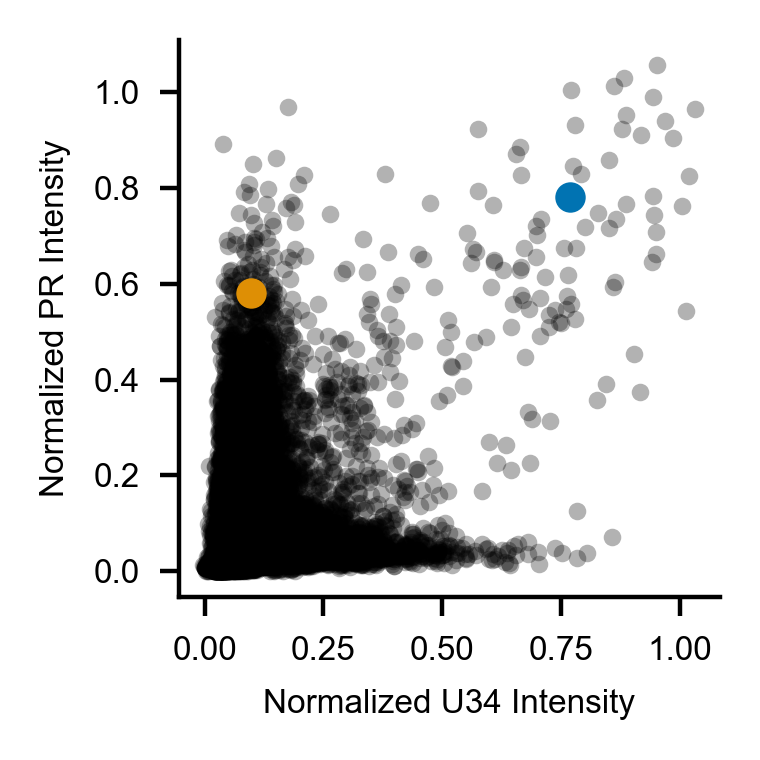

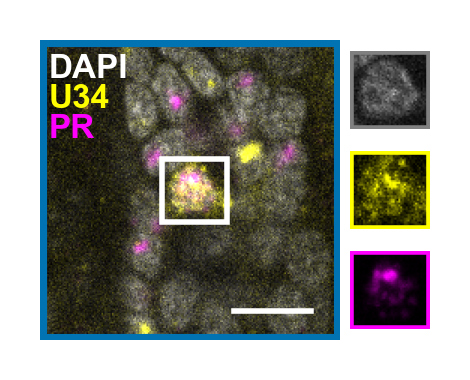

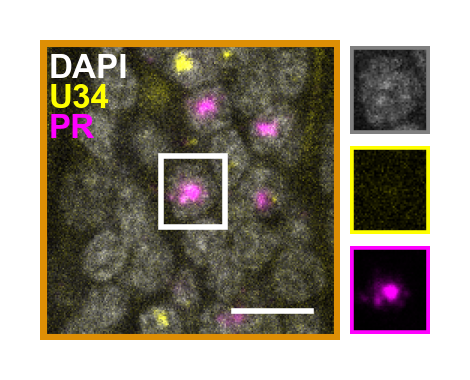

In [68]:
# U34-B3-488 & Lnc4-B1-546 & U21-B5-647 & DAPI 
plot_2_channels(results=results[results["AF488"] < 6].reset_index(drop=True), image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF488", c2="AF546", 
                c1_name="U34", c2_name="PR", 
                c1_color="yellow", c2_color="magenta",
                coordinates=[[0.8, 0.8], [0.1, 0.6]],  
                dapi_max=255, c1_max=100, c2_max=255)

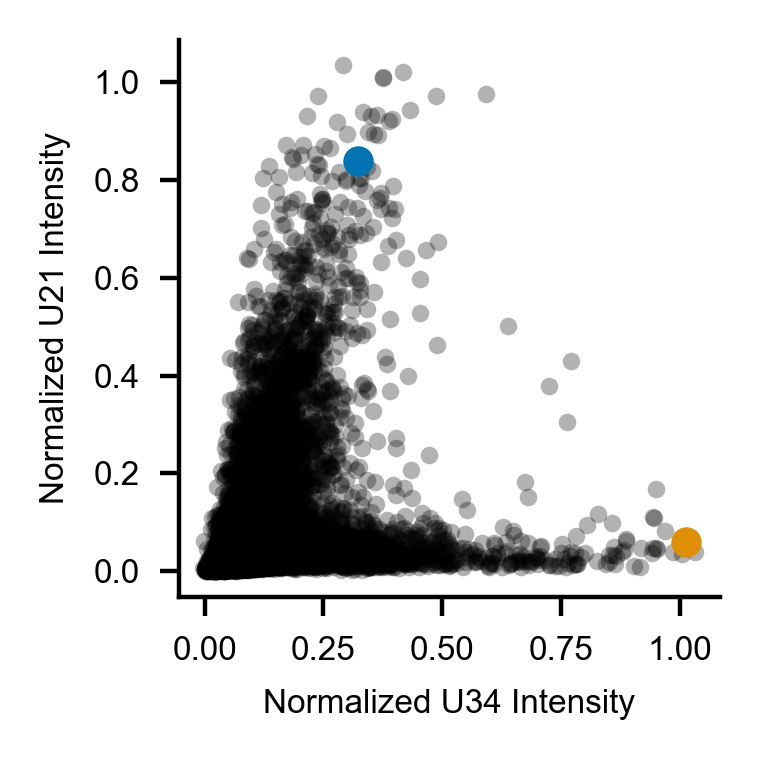

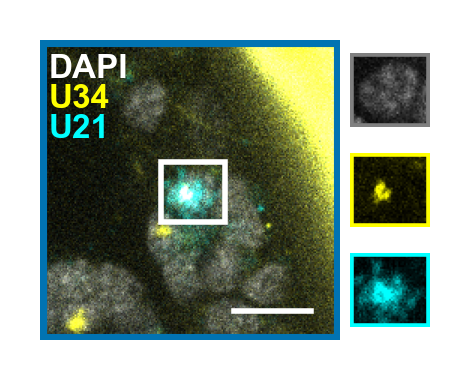

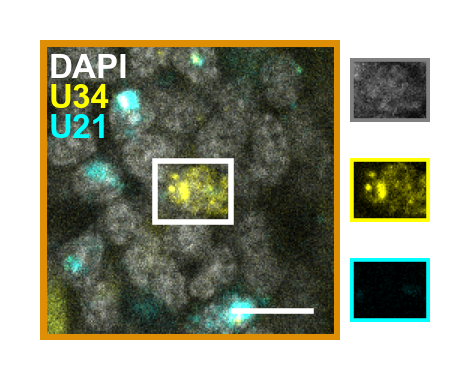

In [27]:
# U34-B3-488 & Lnc4-B1-546 & U21-B5-647 & DAPI 
plot_2_channels(results=results[results["AF488"] < 2].reset_index(drop=True), image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF488", c2="AF647", 
                c1_name="U34", c2_name="U21", 
                c1_color="yellow", c2_color="cyan",
                coordinates=[[0.4, 0.9], [1, 0]],  
                dapi_max=255, c1_max=150, c2_max=150)

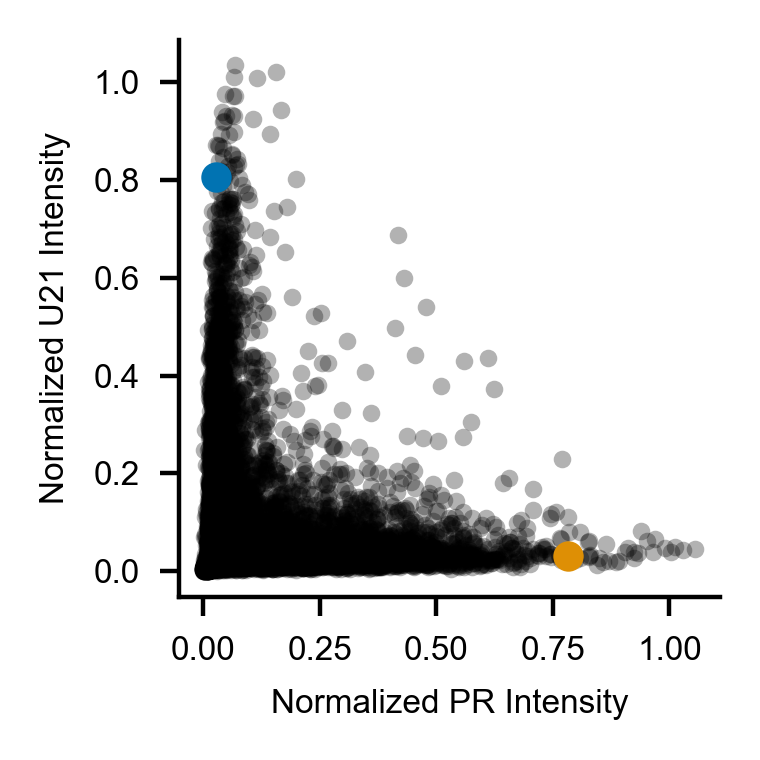

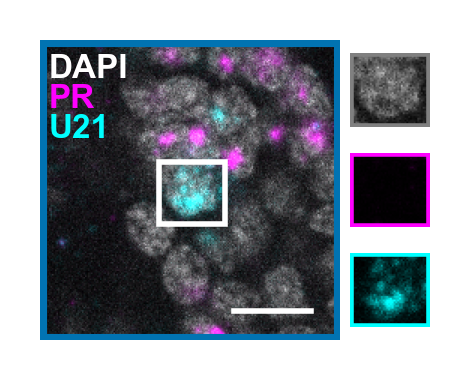

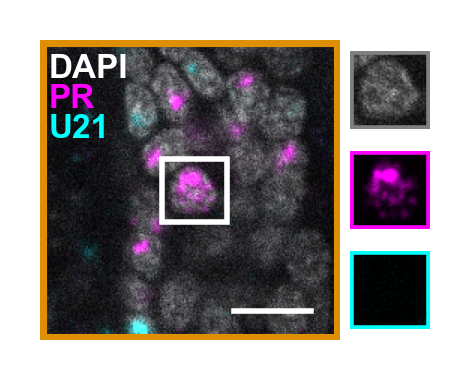

In [28]:
# U34-B3-488 & Lnc4-B1-546 & U21-B5-647 & DAPI 
plot_2_channels(results=results[results["AF488"] < 2].reset_index(drop=True), image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF647", 
                c1_name="PR", c2_name="U21", 
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0, 0.8], [0.8, 0]],  
                dapi_max=255, c1_max=150, c2_max=200)

## lnc3-B3-488 & L16-B2-594 & Lnc2-B5-647 & DAPI
PR1-488, L16-594, PR2-647

In [69]:
input = '20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI'
channels = ['AF488', 'AF594', 'AF647']
channel_names = ["PR2", "L16", "PR1"]
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.00001)
cytoplasmic_results

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250328 3 L16lnc sample 1.czi,AF594,AF488,0.363975,69,PR2,L16 cytoplasmic
1,20250328 3 L16lnc sample 1.czi,AF594,AF594,0.483057,69,L16,L16 cytoplasmic
2,20250328 3 L16lnc sample 1.czi,AF594,AF647,0.141086,69,PR1,L16 cytoplasmic
3,20250328 3 L16lnc sample 2.czi,AF594,AF488,0.362659,59,PR2,L16 cytoplasmic
4,20250328 3 L16lnc sample 2.czi,AF594,AF594,0.531030,59,L16,L16 cytoplasmic
5,20250328 3 L16lnc sample 2.czi,AF594,AF647,0.171562,59,PR1,L16 cytoplasmic
6,20250328 3 L16lnc sample 3.czi,AF594,AF488,0.384543,72,PR2,L16 cytoplasmic
7,20250328 3 L16lnc sample 3.czi,AF594,AF594,0.612551,72,L16,L16 cytoplasmic
8,20250328 3 L16lnc sample 3.czi,AF594,AF647,0.211051,72,PR1,L16 cytoplasmic
9,20250328 3 L16lnc sample 4.czi,AF594,AF488,0.343813,51,PR2,L16 cytoplasmic


In [79]:
cytoplasmic_results_counts['num_cells'].mean()

62.75

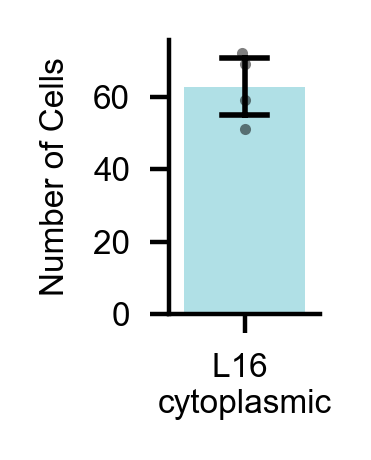

In [70]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, saturation=1, 
            palette=['powderblue'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

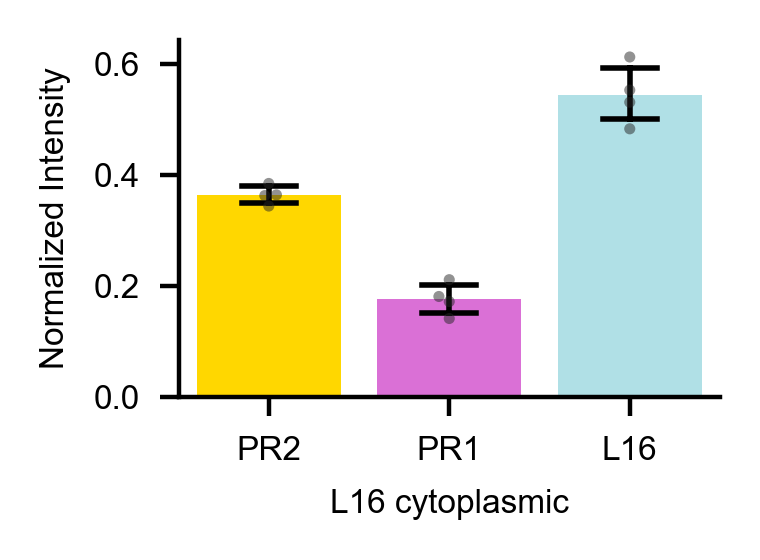

In [71]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
f, ax = plt.subplots(1, 1, figsize=(2, 1.5), dpi = 400)
sns.barplot(data=cytoplasmic_results, x="channel_name", y="intensity", ax=ax, palette=['gold', 'orchid', 'powderblue'], order=["PR2", "PR1", "L16"], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black', legend=False)
sns.swarmplot(data=cytoplasmic_results, x="channel_name", y="intensity", hue="cytoplasmic_name", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("") 
ax.set_ylabel("Normalized Intensity", fontsize=6)
ax.set_xlabel("L16 cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
#plt.legend(fontsize=6, frameon=False, handletextpad=0.1, bbox_to_anchor=(0.2, 1.1), loc='upper left')
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

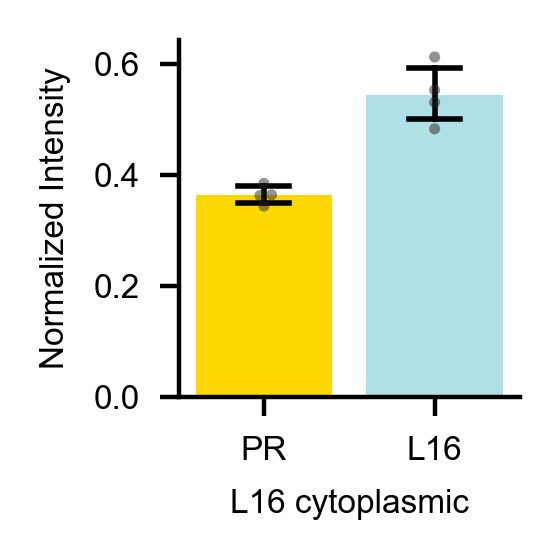

In [72]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.5), dpi = 400)
sns.barplot(data=cytoplasmic_results[cytoplasmic_results['channel_name'] != "PR1"], x="channel_name", y="intensity", ax=ax, palette=['gold', 'powderblue'], order=["PR2", "L16"], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black', legend=False)
sns.swarmplot(data=cytoplasmic_results[cytoplasmic_results['channel_name'] != "PR1"], x="channel_name", y="intensity", hue="cytoplasmic_name", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel("Normalized Intensity", fontsize=6)
ax.set_xticks([0, 1], labels=["PR", "L16"])
ax.set_xlabel("L16 cytoplasmic", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
#plt.legend(fontsize=6, frameon=False, handletextpad=0.1, bbox_to_anchor=(0.2, 1.1), loc='upper left')
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot-L16-PR.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

In [73]:
file_number = 0
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI/20250328 3 L16lnc sample 2.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF488-T1', 'AF647-T1', 'DAPI-T2', 'AF594-T2']}
Image shape: (1, 81, 4, 2048, 2048)
Loaded ../results/20250328 3 P14 Lnc3-b3-488 L16-b2-594 Lnc2-b5-647 DAPI/20250328 3 L16lnc sample 2_rois.npy


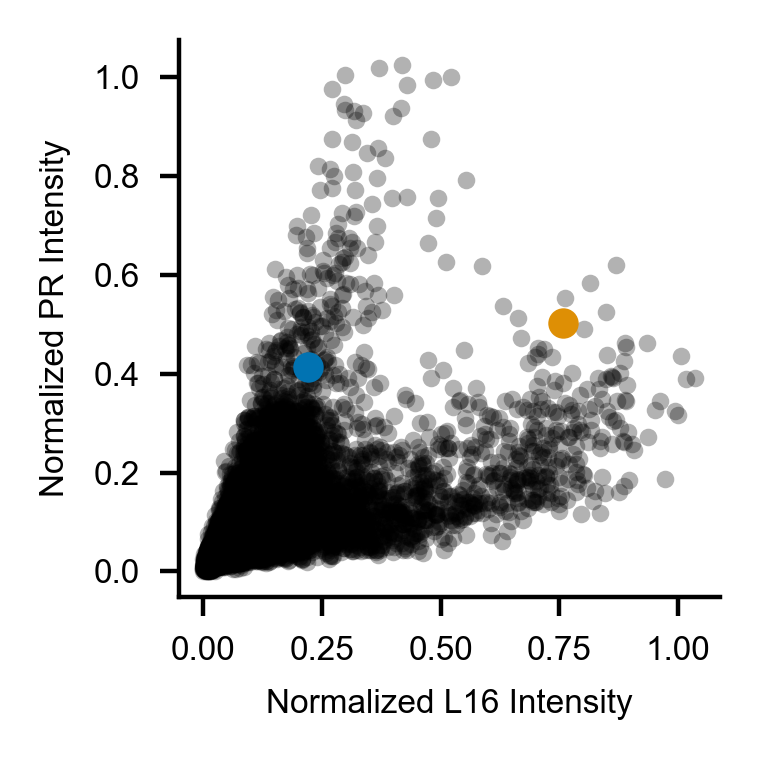

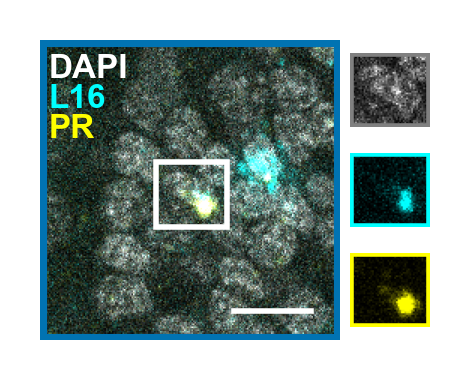

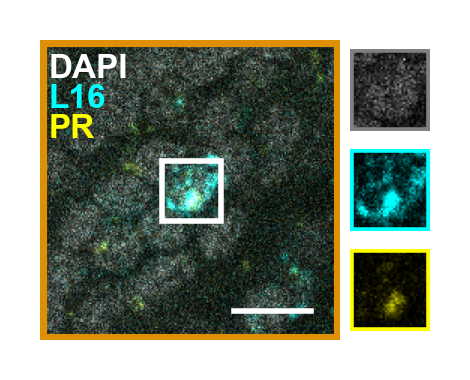

In [77]:
# PR1-488, L16-594, PR2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF594", c2="AF647", 
                c1_name="L16", c2_name="PR", 
                c1_color="cyan", c2_color="yellow",
                coordinates=[[0.25, 0.4], [0.8, 0.5]],  
                dapi_max=100, c1_max=120, c2_max=150)

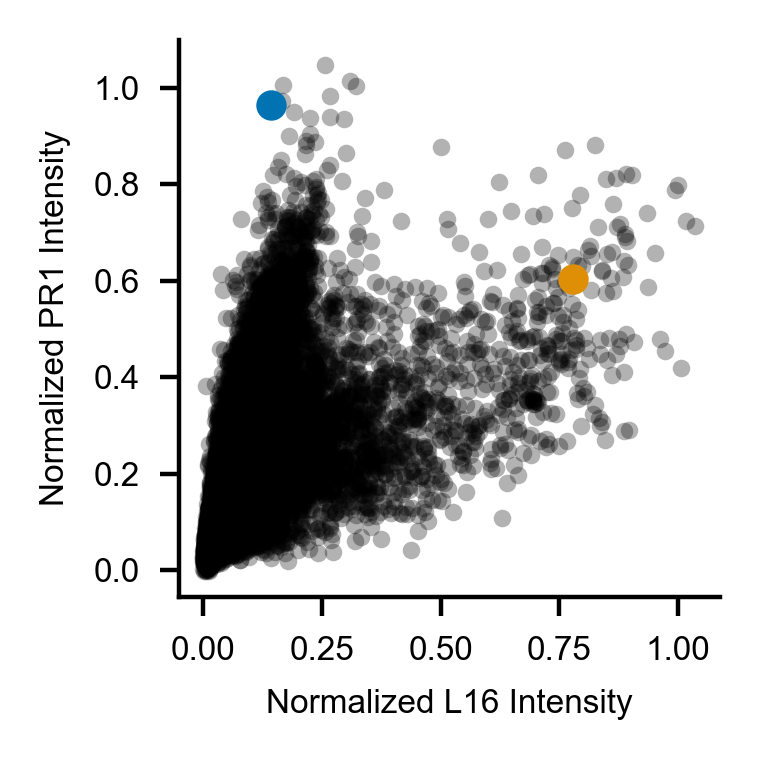

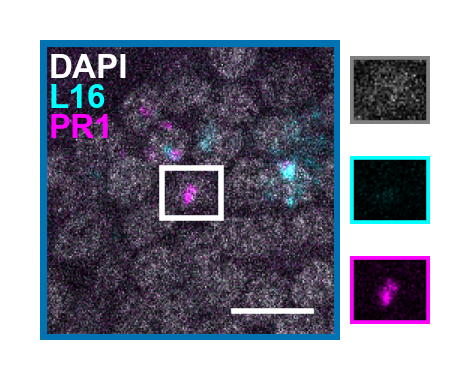

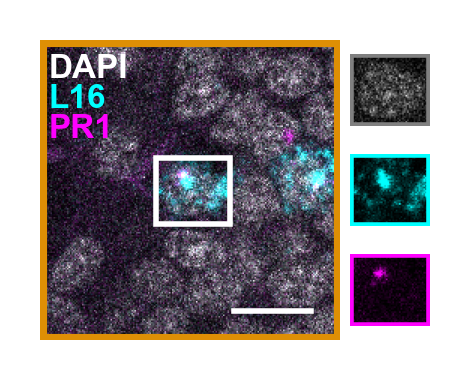

In [35]:
# PR1-488, L16-594, PR2-647
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF594", c2="AF488", 
                c1_name="L16", c2_name="PR1", 
                c1_color="cyan", c2_color="magenta",
                coordinates=[[0.1, 0.9], [0.8, 0.6]],  
                dapi_max=70, c1_max=200, c2_max=150)

## G1-B1-546 & Lnc7-B2-647 & DAPI 

In [89]:
input = '20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi'
channels = ['AF546', 'AF647']
channel_names = ["G1", "LOC113562161"]
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.00001)
cytoplasmic_results

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250325 5 G1 lncrna sample 1 great.czi,AF546,AF546,0.696449,12,G1,G1 cytoplasmic
1,20250325 5 G1 lncrna sample 1 great.czi,AF546,AF647,0.608153,12,LOC113562161,G1 cytoplasmic
2,20250325 5 G1 lncrna sample 2 great.czi,AF546,AF546,0.726343,13,G1,G1 cytoplasmic
3,20250325 5 G1 lncrna sample 2 great.czi,AF546,AF647,0.723747,13,LOC113562161,G1 cytoplasmic
4,20250325 5 G1 lncrna sample 3 great.czi,AF546,AF546,0.589077,14,G1,G1 cytoplasmic
5,20250325 5 G1 lncrna sample 3 great.czi,AF546,AF647,0.546193,14,LOC113562161,G1 cytoplasmic
6,20250325 5 G1 lncrna sample 4 great.czi,AF546,AF546,0.650249,13,G1,G1 cytoplasmic
7,20250325 5 G1 lncrna sample 4 great.czi,AF546,AF647,0.501141,13,LOC113562161,G1 cytoplasmic


In [91]:
cytoplasmic_results_counts['num_cells'].mean()

13.0

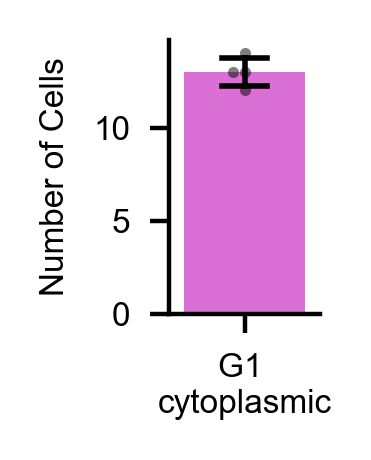

In [37]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, saturation=1, 
            palette=['orchid'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.set_xlabel("") 
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

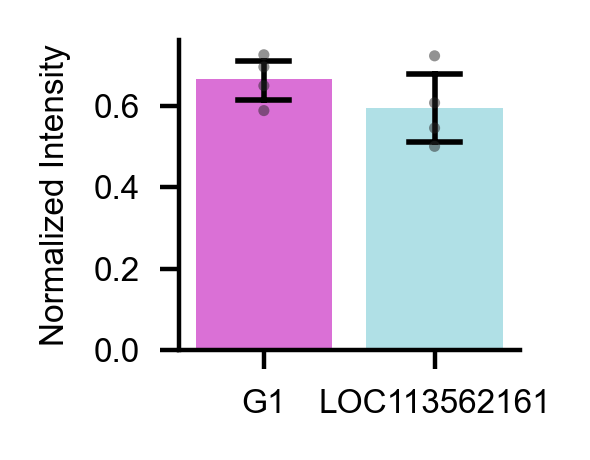

In [38]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
f, ax = plt.subplots(1, 1, figsize=(1.5, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results, x="channel_name", y="intensity", ax=ax, palette=['orchid', 'powderblue'], order=["G1", "LOC113562161"], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black', legend=False)
sns.swarmplot(data=cytoplasmic_results, x="channel_name", y="intensity", hue="cytoplasmic_name", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("") 
ax.set_ylabel("Normalized Intensity", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
#plt.legend(fontsize=6, frameon=False, handletextpad=0.1, bbox_to_anchor=(0.2, 1.1), loc='upper left')
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

In [ ]:
file_number = 2
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi/20250325 5 G1 lncrna sample 1 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'DAPI-T2', 'AF647-T2']}
Image shape: (1, 78, 3, 2048, 2048)
Loaded ../results/20250325 5 p14 g1-b1-546 lnc7-b2-647 dapi/20250325 5 G1 lncrna sample 1 great_rois.npy


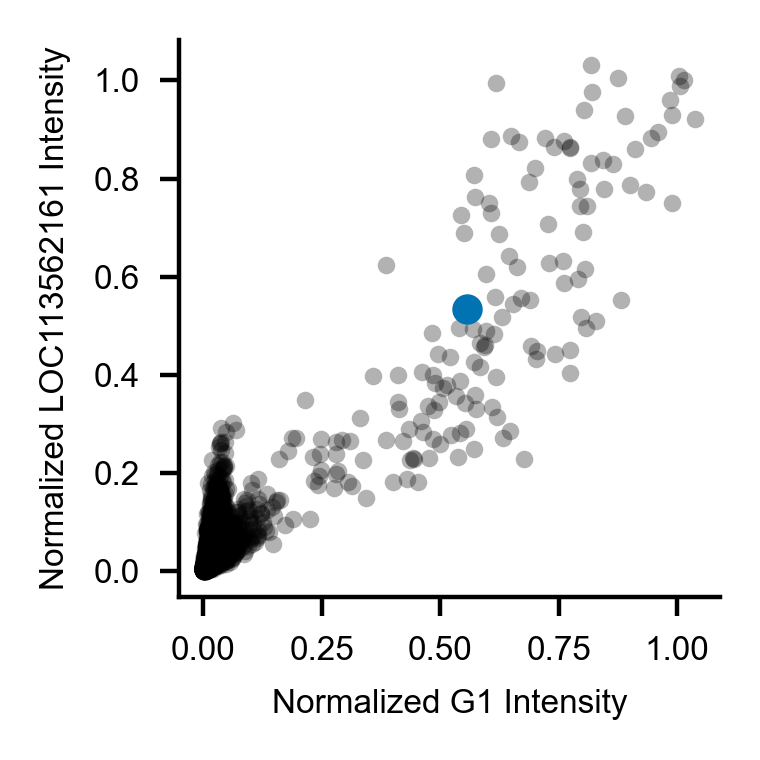

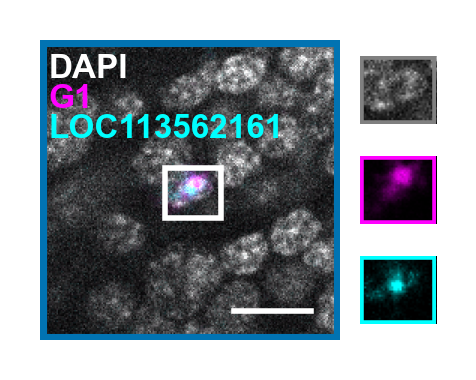

In [103]:
# G1-B1-546 & Lnc7-B2-647 & DAPI 
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF647", 
                c1_name="G1", c2_name="LOC113562161", 
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0.6, 0.6]],  
                dapi_max=150, c1_max=200, c2_max=150)

## 9E198-B3-488 & 9E197-B1-546 & 9E196-B2-647 & DAPI

In [41]:
import warnings 
warnings.filterwarnings("ignore")

In [9]:
input = '20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi'
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["9E198", "9E197", "9E196"]
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.00001)
cytoplasmic_results.head()

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250325 5 t35 sample 1 great.czi,AF488,AF488,0.659396,8,9E198,9E198 cytoplasmic
1,20250325 5 t35 sample 1 great.czi,AF488,AF546,0.048855,8,9E197,9E198 cytoplasmic
2,20250325 5 t35 sample 1 great.czi,AF488,AF647,0.034076,8,9E196,9E198 cytoplasmic
3,20250325 5 t35 sample 1 great.czi,AF546,AF488,0.220107,12,9E198,9E197 cytoplasmic
4,20250325 5 t35 sample 1 great.czi,AF546,AF546,0.681499,12,9E197,9E197 cytoplasmic


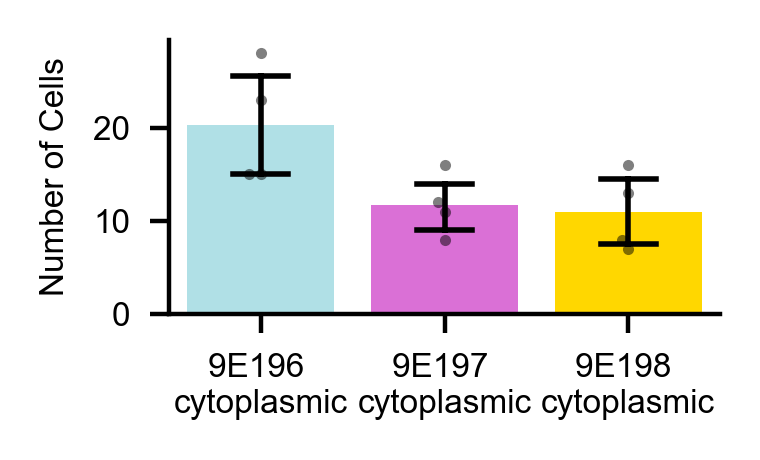

In [10]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(2, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, saturation=1, 
            palette=['powderblue', 'orchid', 'gold'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.set_xlabel("") 
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

2025-04-02 17:37:45,797 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-04-02 17:37:45,801 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


2025-04-02 17:37:45,835 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-04-02 17:37:45,839 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-04-02 17:37:45,840 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-04-02 17:37:45,873 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-04-02 17:37:45,877 [INFO] Using categorical units to plot a list of strings that are all parsable as floats or 

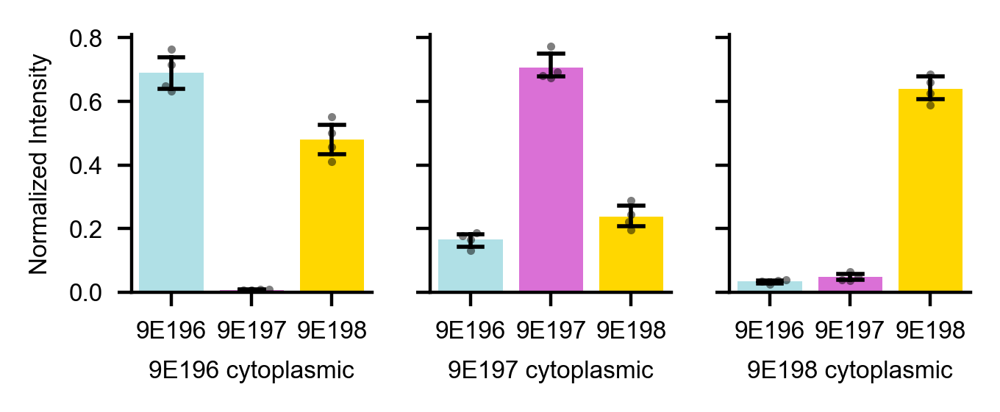

In [11]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
cytoplasmic_channels = ["9E196 cytoplasmic", "9E197 cytoplasmic", "9E198 cytoplasmic"]
f, axs = plt.subplots(1, 3, figsize=(3.5, 1.5), dpi = 400, sharey=True)
for i, cytoplasmic_channel in enumerate(cytoplasmic_channels):
    cytoplasmic_results_channel = cytoplasmic_results[cytoplasmic_results["cytoplasmic_name"] == cytoplasmic_channel]
    ax = axs[i]
    sns.barplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, palette=['powderblue', 'orchid', 'gold'], order=["9E196", "9E197", "9E198"], saturation=1, 
                alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
    sns.swarmplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True, order=["9E196", "9E197", "9E198"])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"{cytoplasmic_channel}", fontsize=6)
    ax.set_ylabel("Normalized Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

In [29]:
file_number = 0
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi/20250325 5 t35 sample 4 great.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 102, 4, 2048, 2048)
Loaded ../results/20250325 6 9e198-b3-488 9e197-b1-546 9e196-b2-647 dapi/20250325 5 t35 sample 4 great_rois.npy


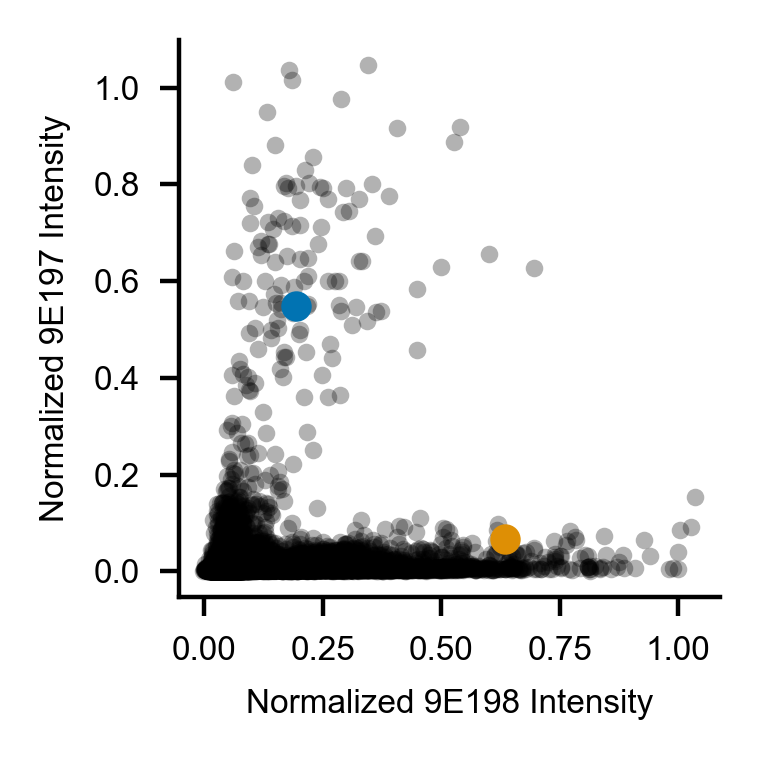

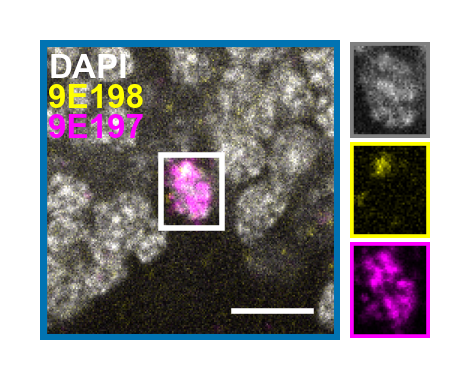

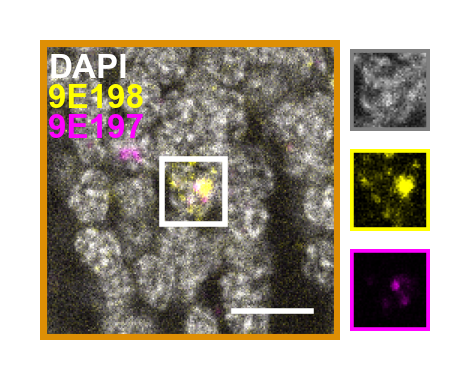

In [30]:
# 9E198-B3-488 & 9E197-B1-546 & 9E196-B2-647 & DAPI
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF488", c2="AF546", 
                c1_name="9E198", c2_name="9E197", 
                c1_color="yellow", c2_color="magenta",
                coordinates=[[0.2, 0.55], [0.7, 0.2]],  
                dapi_max=255, c1_max=90, c2_max=90)

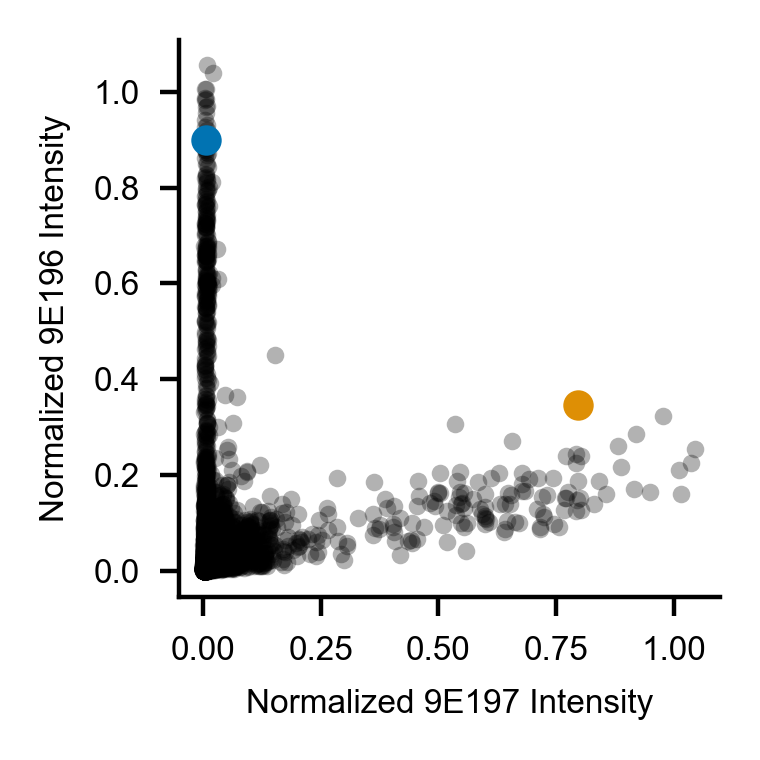

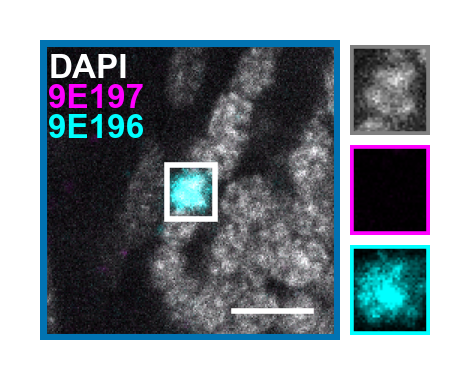

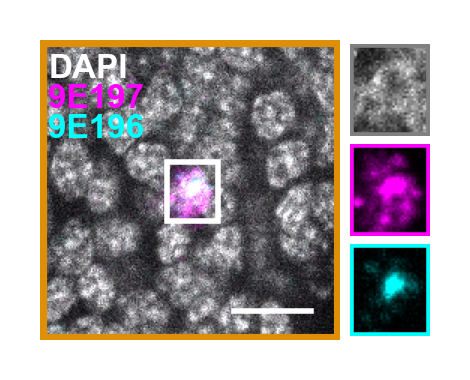

In [31]:
# 9E198-B3-488 & 9E197-B1-546 & 9E196-B2-647 & DAPI
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF647", 
                c1_name="9E197", c2_name="9E196", 
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0, 0.9], [0.8, 0.3]],  
                dapi_max=255, c1_max=100, c2_max=150)

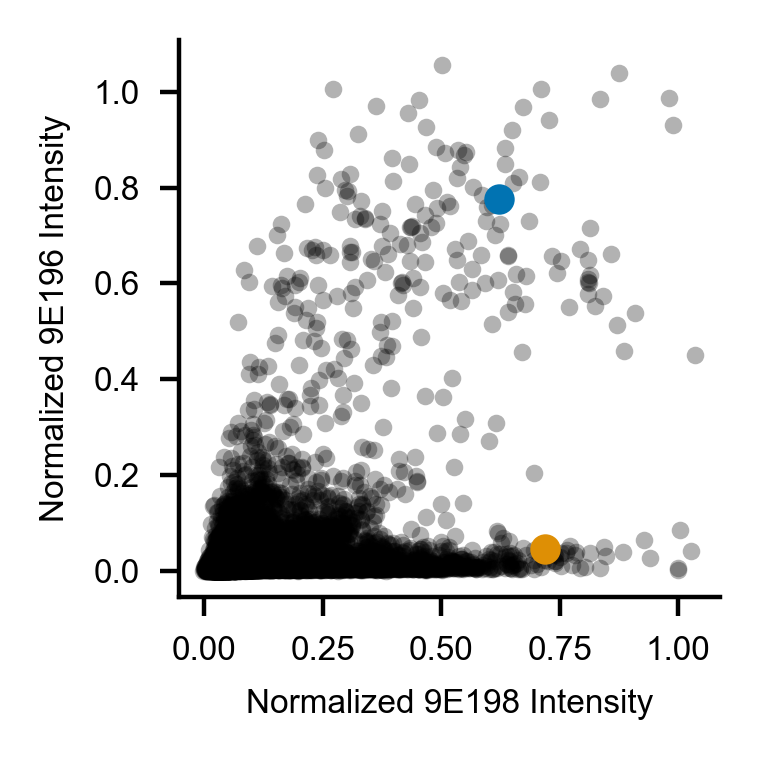

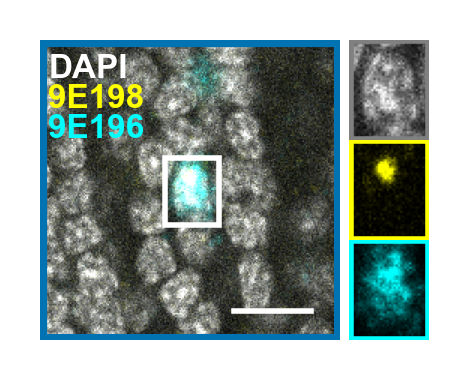

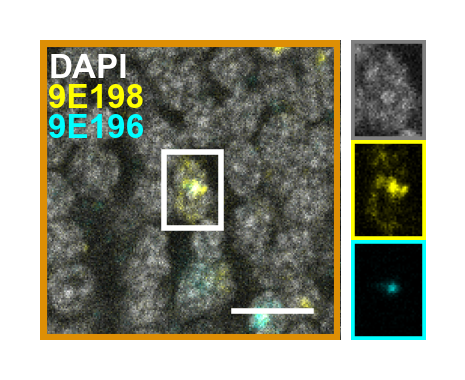

In [38]:
# 9E198-B3-488 & 9E197-B1-546 & 9E196-B2-647 & DAPI
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF488", c2="AF647", 
                c1_name="9E198", c2_name="9E196", 
                c1_color="yellow", c2_color="cyan",
                coordinates=[[0.6, 0.8], [0.75, 0.1]],  
                dapi_max=255, c1_max=150, c2_max=200)

## 20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi

In [112]:
input = '20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi'
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["9E129", "LOC105275104", "9E116"]
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.00001) 
cytoplasmic_results.head()

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250328 4 KLF sample 1.czi,AF488,AF488,0.709784,18,9E129,9E129 cytoplasmic
1,20250328 4 KLF sample 1.czi,AF488,AF546,0.218597,18,LOC105275104,9E129 cytoplasmic
2,20250328 4 KLF sample 1.czi,AF488,AF647,0.133728,18,9E116,9E129 cytoplasmic
3,20250328 4 KLF sample 1.czi,AF647,AF488,0.120240,37,9E129,9E116 cytoplasmic
4,20250328 4 KLF sample 1.czi,AF647,AF546,0.185669,37,LOC105275104,9E116 cytoplasmic


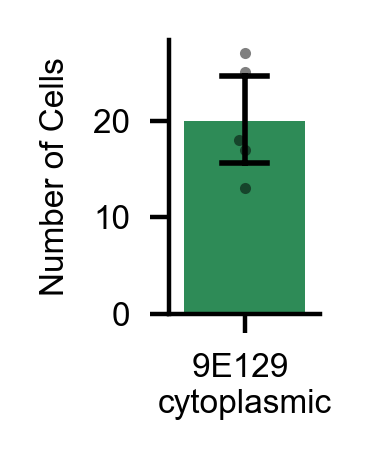

In [113]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(1, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts[cytoplasmic_results_counts['cytoplasmic_name'] == "9E129 cytoplasmic"], x='cytoplasmic_name', y='num_cells', ax=ax, saturation=1, 
            palette=['seagreen'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts[cytoplasmic_results_counts['cytoplasmic_name'] == "9E129 cytoplasmic"], x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.set_xlabel("") 
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

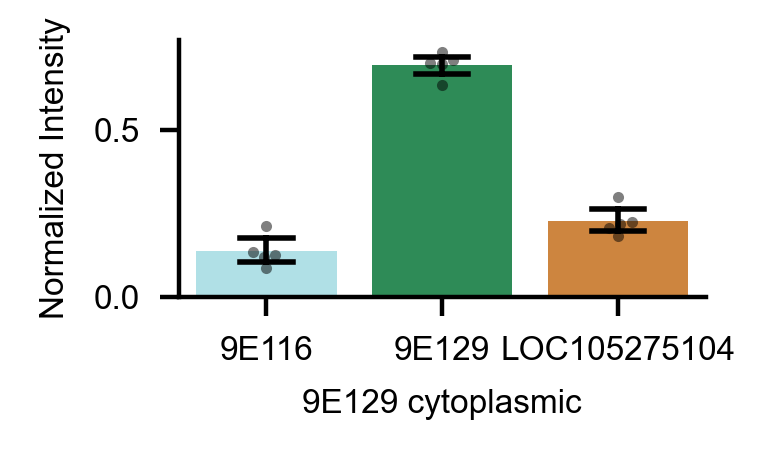

In [114]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
cytoplasmic_channels = ["9E129 cytoplasmic"]
f, ax = plt.subplots(1, 1, figsize=(2, 1.25), dpi = 400, sharey=True)
cytoplasmic_results_channel = cytoplasmic_results[cytoplasmic_results["cytoplasmic_name"] == "9E129 cytoplasmic"]
sns.barplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, palette=['powderblue', 'seagreen', 'peru'], order=["9E116", "9E129", "LOC105275104"], saturation=1, 
            alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
sns.swarmplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True, order=["9E116", "9E129", "LOC105275104"])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("9E129 cytoplasmic", fontsize=6)
ax.set_ylabel("Normalized Intensity", fontsize=6)
ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

In [122]:
file_number = 0
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi/20250328 4 KLF sample 3.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 94, 4, 2048, 2048)
Loaded ../results/20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi/20250328 4 KLF sample 3_rois.npy


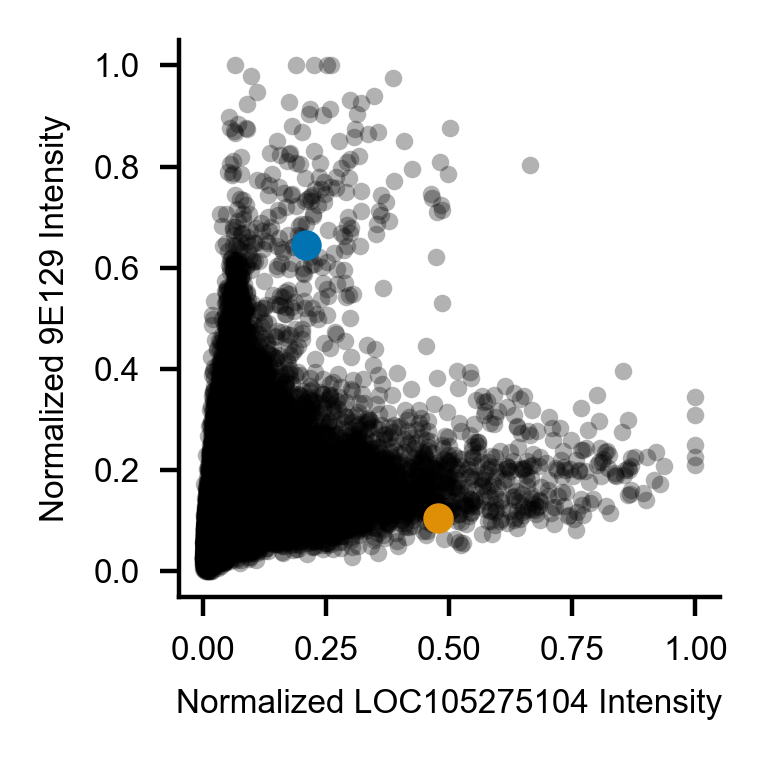

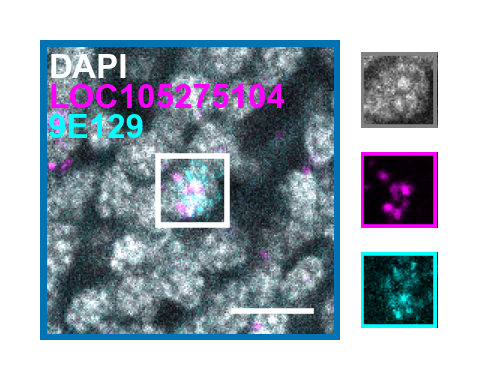

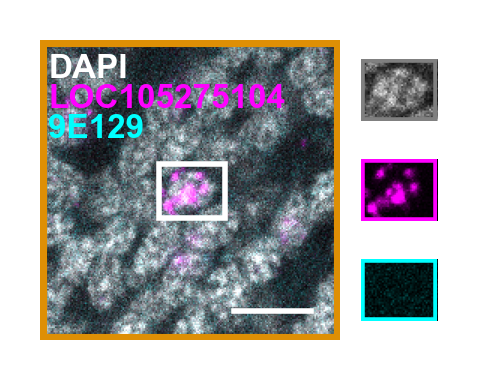

In [138]:
# '20250328 4 P14 9E129-b3-488 LOC104-b1-546 9E116-b2-647 dapi' LOC105275104
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF546", c2="AF488", 
                c1_name="LOC105275104", c2_name="9E129", 
                c1_color="magenta", c2_color="cyan",
                coordinates=[[0.22, 0.65], [0.5, 0.1]],  
                dapi_max=255, c1_max=100, c2_max=100)

## LOC105282603-B3-488 & 9E108-B1-546 & 9E116-B2-647 & DAPI 

In [36]:
input = '20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI'
channels = ['AF488', 'AF546', 'AF647']
channel_names = ["LOC105282603", "9E108", "9E116"]
results, cytoplasmic_results, cytoplasmic_results_counts = load_cytoplasmic_cell_counts(input, channels=channels, channel_names=channel_names, normalization=0.001) 
cytoplasmic_results.head()

,image,cytoplasmic,channel,intensity,num_cells,channel_name,cytoplasmic_name
0,20250328 5 ZP sample 1.czi,AF488,AF488,0.517211,29,LOC105282603,LOC105282603 cytoplasmic
1,20250328 5 ZP sample 1.czi,AF488,AF546,0.109436,29,9E108,LOC105282603 cytoplasmic
2,20250328 5 ZP sample 1.czi,AF488,AF647,0.022418,29,9E116,LOC105282603 cytoplasmic
3,20250328 5 ZP sample 1.czi,AF546,AF488,0.334476,29,LOC105282603,9E108 cytoplasmic
4,20250328 5 ZP sample 1.czi,AF546,AF546,0.710222,29,9E108,9E108 cytoplasmic


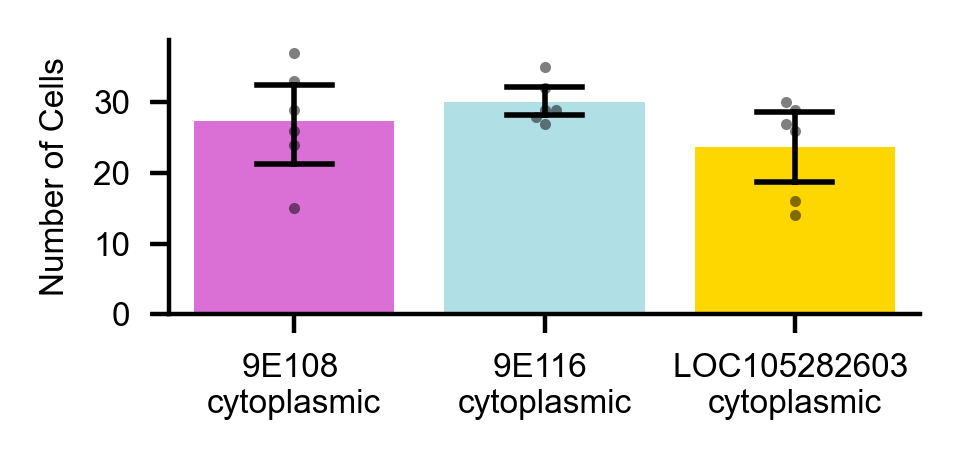

In [37]:
# Plot the number of cytoplasmic cells per image 
f, ax = plt.subplots(1, 1, figsize=(2.5, 1.25), dpi = 400)
sns.barplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, saturation=1, 
            palette=['orchid', 'powderblue', 'gold'], alpha=1, lw=0, errcolor='black', capsize=0.3, errwidth=1)
sns.swarmplot(data=cytoplasmic_results_counts, x='cytoplasmic_name', y='num_cells', ax=ax, color='black', alpha=0.5, s=2)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_xlabel("")
ax.set_ylabel("Number of Cells", fontsize=6)
ax.set_xlabel("") 
ax.tick_params(axis='both', which='major', labelsize=6)
# Replace "cytoplasmic" with "\ncytoplasmic" in the x-ticks
xticks = ax.get_xticks()
xticklabels = [tick.get_text().replace("cytoplasmic", "\ncytoplasmic") for tick in ax.get_xticklabels()]
ax.set_xticklabels(xticklabels)
plt.tight_layout()
os.makedirs(f"../figures/model_B_only_OSNs/{input}", exist_ok=True)
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-cell-counts.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

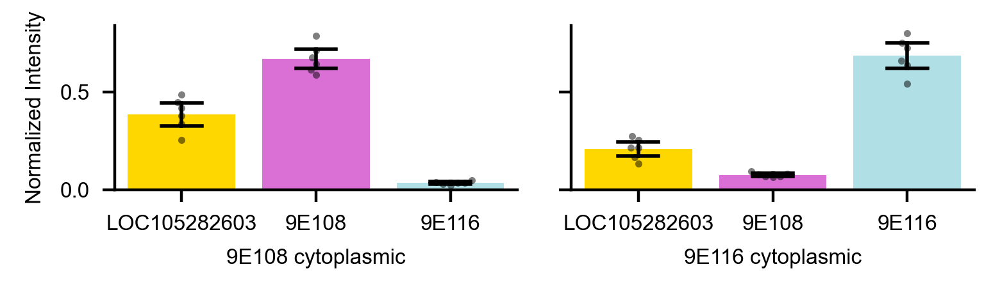

In [38]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
# LOC105282603-b3-488 9E108-b1-546 9E116-b2-647 DAPI 
cytoplasmic_channels = ["9E108 cytoplasmic", "9E116 cytoplasmic"]
f, axs = plt.subplots(1, 2, figsize=(4, 1.25), dpi = 400, sharey=True)
for i, cytoplasmic_channel in enumerate(cytoplasmic_channels):
    cytoplasmic_results_channel = cytoplasmic_results[cytoplasmic_results["cytoplasmic_name"] == cytoplasmic_channel]
    cytoplasmic_results_channel['intensity'] = cytoplasmic_results_channel['intensity'].astype(np.float32)
    ax = axs[i]
    sns.barplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, palette=['gold', 'orchid', 'powderblue'], order=["LOC105282603", "9E108", "9E116"], saturation=1, 
                alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
    sns.swarmplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True, order=["LOC105282603", "9E108", "9E116"])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"{cytoplasmic_channel}", fontsize=6)
    ax.set_ylabel("Normalized Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)
plt.tight_layout()
plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
plt.show()

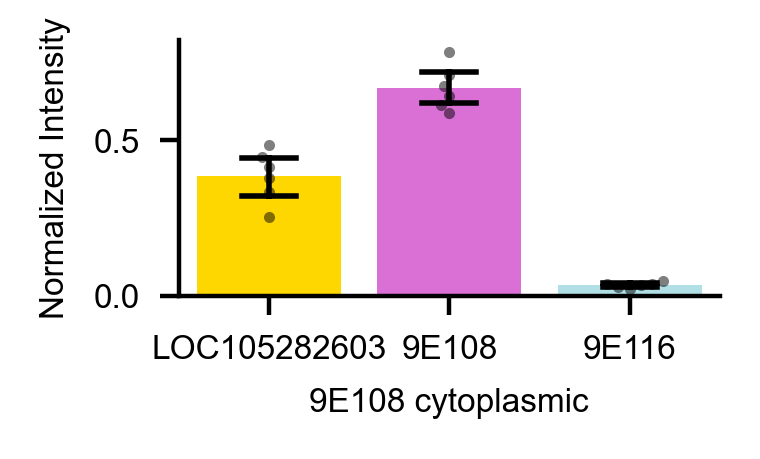

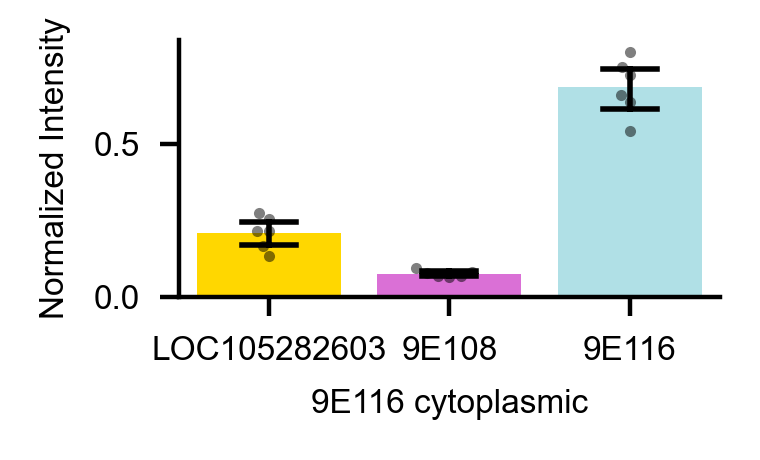

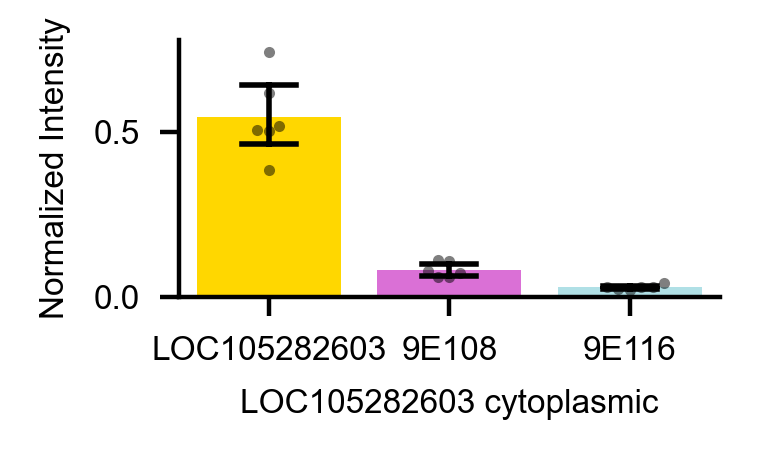

In [39]:
# Plot bar plots of AF546, AF488 and AF647, split by cytoplasmic
cytoplasmic_channels = ["9E108 cytoplasmic", "9E116 cytoplasmic", "LOC105282603 cytoplasmic"]
for cytoplasmic_channel in cytoplasmic_channels:
    f, ax = plt.subplots(1, 1, figsize=(2, 1.25), dpi = 400, sharey=True)
    cytoplasmic_results_channel = cytoplasmic_results[cytoplasmic_results["cytoplasmic_name"] == cytoplasmic_channel]
    sns.barplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, palette=['gold', 'orchid', 'powderblue'], order=["LOC105282603", "9E108", "9E116"], saturation=1, 
                alpha=1, lw=0, errorbar=("ci", 95), capsize=0.3, errwidth=1, errcolor='black')
    sns.swarmplot(data=cytoplasmic_results_channel, x="channel_name", y="intensity", ax=ax, color='black', alpha=0.5, s=2, legend=False, dodge=True, order=["LOC105282603", "9E108", "9E116"])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xlabel(f"{cytoplasmic_channel}", fontsize=6)
    ax.set_ylabel("Normalized Intensity", fontsize=6)
    ax.tick_params(axis='both', which='major', labelsize=6)
    plt.tight_layout()
    plt.savefig(f"../figures/model_B_only_OSNs/{input}/{input}-cytoplasmic-barplot-{cytoplasmic_channel}.pdf", format="pdf", pad_inches=0, bbox_inches=0, transparent=False)
    plt.show()

file_number = 4, 0.37, 0.12

In [102]:
file_number = 4
results_files = os.listdir(f'../raw-data/{input}')
image = results_files[file_number].replace(".csv", ".czi")
image_path = f'../raw-data/{input}/{image}'
reader = napari_get_reader(image_path)
if reader is not None:
    layer_data = reader(image_path)
    image_data, metadata, layer_type = layer_data[0]
    print(f"Loaded {image_path}")
    print("Metadata:", metadata)
    print("Image shape:", image_data.shape)  

# Load ROIs 
all_rois_path = f'../results/{input}/{image.replace(".czi", "_rois.npy")}'
all_rois = np.load(all_rois_path)
print(f"Loaded {all_rois_path}")

Loaded ../raw-data/20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI/20250328 5 ZP sample 6.czi
Metadata: {'rgb': False, 'channel_axis': 2, 'translate': (0.0, 0.0, 0.0, 0.0), 'scale': (1.0, 1.0, 0.0974884033203125, 0.0974884033203125), 'contrast_limits': None, 'name': ['AF546-T1', 'AF488-T2', 'DAPI-T3', 'AF647-T3']}
Image shape: (1, 85, 4, 2048, 2048)
Loaded ../results/20250328 5 P14 LOC603-b3-488 9E108-b1-546 9E116-b2-647 DAPI/20250328 5 ZP sample 6_rois.npy


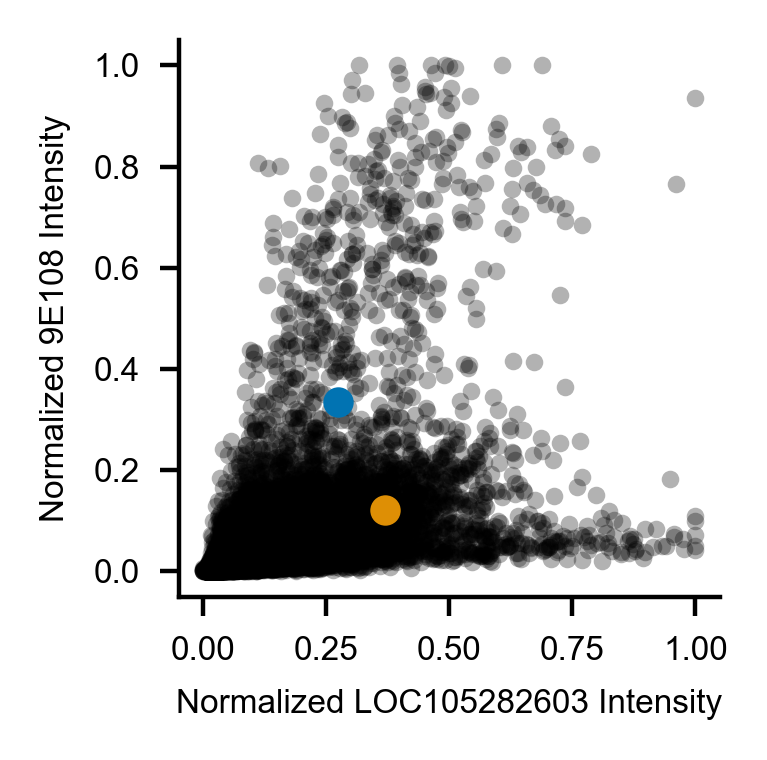

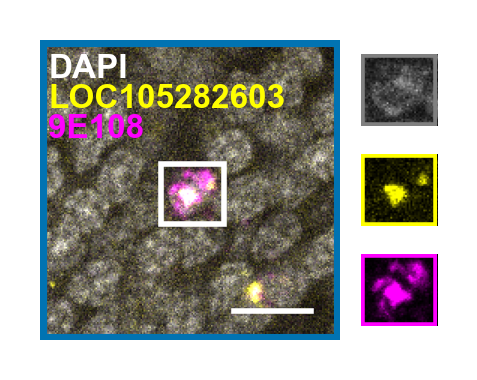

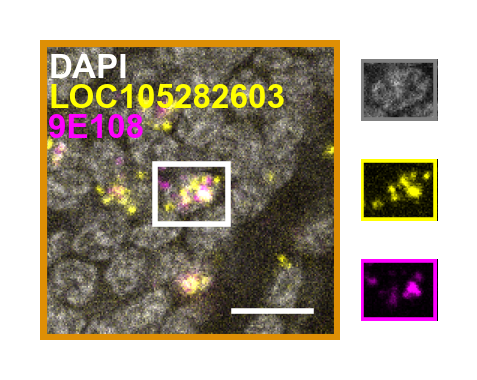

In [111]:
# LOC105282603-B3-488 & 9E108-B1-546 & 9E116-B2-647 & DAPI 
plot_2_channels(results=results, image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF488", c2="AF546", 
                c1_name="LOC105282603", c2_name="9E108", 
                c1_color="yellow", c2_color="magenta",
                coordinates=[[0.3, 0.35], [0.37, 0.12]],  
                dapi_max=255, c1_max=100, c2_max=80)

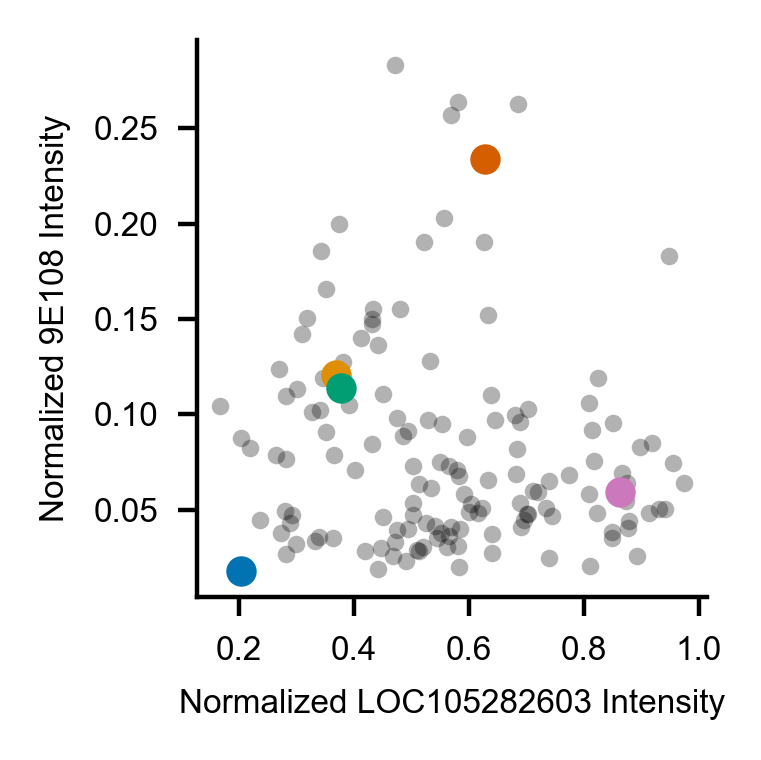

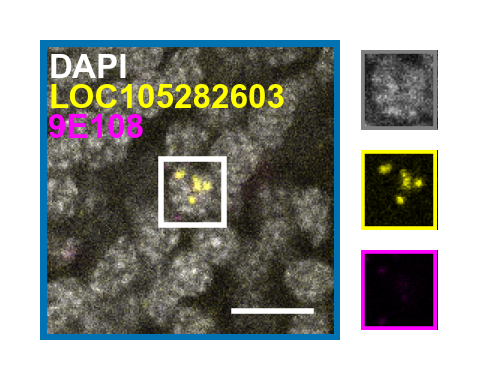

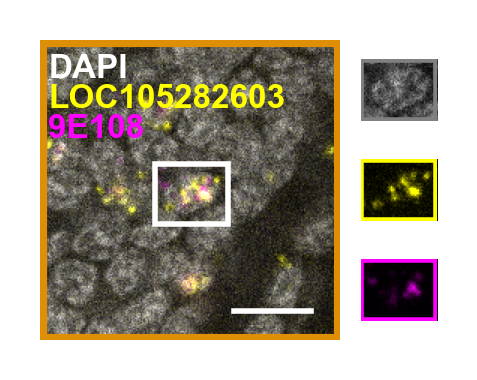

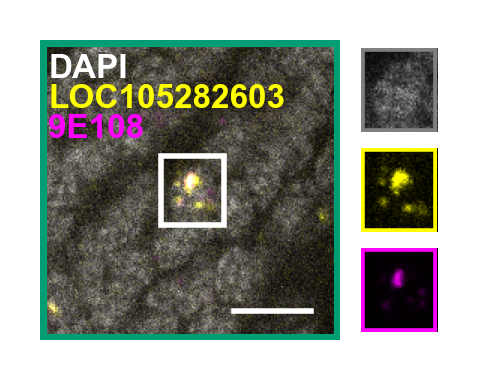

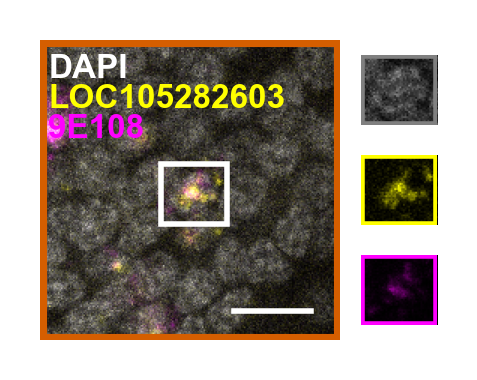

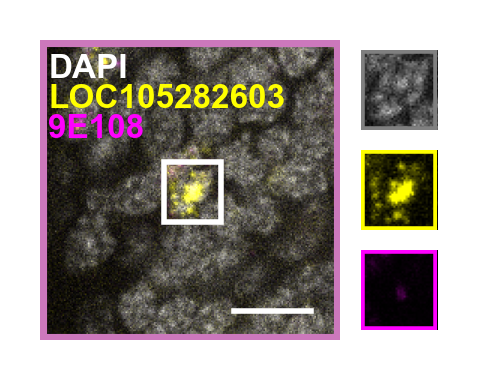

In [93]:
# LOC105282603-B3-488 & 9E108-B1-546 & 9E116-B2-647 & DAPI 
plot_2_channels(results=results[results['cytoplasmic'] == "AF488"], image=image_data, metadata=metadata, 
                all_rois=all_rois, input=input, file=image, 
                c1="AF488", c2="AF546", 
                c1_name="LOC105282603", c2_name="9E108", 
                c1_color="yellow", c2_color="magenta",
                coordinates=[[0.2, 0.1], [0.3, 0.3], [0.4, 0.1], [0.6, 0.25], [0.8, 0.1]],  
                dapi_max=255, c1_max=150, c2_max=150)